In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
import time
import csv
import random
import itertools
import numpy as np

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

from PIL import Image

%matplotlib inline
import matplotlib.pyplot as plt

In [ ]:
SEED = 1234

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


In [ ]:
!nvidia-smi

Mon Mar 29 14:57:48 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.56       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   63C    P8    11W /  70W |      3MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

### Scaling function
Function for rescaling to range [0, 1]. This is needed for displaying images.

In [ ]:
def scale_0_1(x):
  return (x+1)/2

## Loading preprocessed tensors
All tensors were scaled in [-1,1].

In [ ]:
PATH = '/content/gdrive/MyDrive/VanGoghGAN_Landscapes'

#boudin_originals = torch.load(PATH+'/Dataset/Boudin Originals.pt')
boudin_sketches_3d = torch.load(PATH+'/Dataset/Boudin Sketches 3D.pt')

#caillebotte_originals = torch.load(PATH+'/Dataset/Caillebotte Originals.pt')
caillebotte_sketches_3d = torch.load(PATH+'/Dataset/Caillebotte Sketches 3D.pt')

#cezanne_originals = torch.load(PATH+'/Dataset/Cezanne Originals.pt')
cezanne_sketches_3d = torch.load(PATH+'/Dataset/Cezanne Sketches 3D.pt')

#chase_originals = torch.load(PATH+'/Dataset/Chase Originals.pt')
chase_sketches_3d = torch.load(PATH+'/Dataset/Chase Sketches 3D.pt')

#gauguin_originals = torch.load(PATH+'/Dataset/Gauguin Originals.pt')
gauguin_sketches_3d = torch.load(PATH+'/Dataset/Gauguin Sketches 3D.pt')

#gorbatov_originals = torch.load(PATH+'/Dataset/Gorbatov Originals.pt')
gorbatov_sketches_3d = torch.load(PATH+'/Dataset/Gorbatov Sketches 3D.pt')

#guillaumin_originals = torch.load(PATH+'/Dataset/Guillaumin Originals.pt')
guillaumin_sketches_3d = torch.load(PATH+'/Dataset/Guillaumin Sketches 3D.pt')

#hassam_originals = torch.load(PATH+'/Dataset/Hassam Originals.pt')
hassam_sketches_3d = torch.load(PATH+'/Dataset/Hassam Sketches 3D.pt')

#korovin_originals = torch.load(PATH+'/Dataset/Korovin Originals.pt')
korovin_sketches_3d = torch.load(PATH+'/Dataset/Korovin Sketches 3D.pt')

#loiseau_originals = torch.load(PATH+'/Dataset/Loiseau Originals.pt')
loiseau_sketches_3d = torch.load(PATH+'/Dataset/Loiseau Sketches 3D.pt')

#martin_originals = torch.load(PATH+'/Dataset/Martin Originals.pt')
martin_sketches_3d = torch.load(PATH+'/Dataset/Martin Sketches 3D.pt')

#maufra_originals = torch.load(PATH+'/Dataset/Maufra Originals.pt')
maufra_sketches_3d = torch.load(PATH+'/Dataset/Maufra Sketches 3D.pt')

#metcalf_originals = torch.load(PATH+'/Dataset/Metcalf Originals.pt')
metcalf_sketches_3d = torch.load(PATH+'/Dataset/Metcalf Sketches 3D.pt')

#monet_originals = torch.load(PATH+'/Dataset/Monet Originals.pt')
monet_sketches_3d = torch.load(PATH+'/Dataset/Monet Sketches 3D.pt')

#pissarro_originals = torch.load(PATH+'/Dataset/Pissarro Originals.pt')
pissarro_sketches_3d = torch.load(PATH+'/Dataset/Pissarro Sketches 3D.pt')

#renoir_originals = torch.load(PATH+'/Dataset/Renoir Originals.pt')
renoir_sketches_3d = torch.load(PATH+'/Dataset/Renoir Sketches 3D.pt')

#robinson_originals = torch.load(PATH+'/Dataset/Robinson Originals.pt')
robinson_sketches_3d = torch.load(PATH+'/Dataset/Robinson Sketches 3D.pt')

#rose_originals = torch.load(PATH+'/Dataset/Rose Originals.pt')
rose_sketches_3d = torch.load(PATH+'/Dataset/Rose Sketches 3D.pt')

#sisley_originals = torch.load(PATH+'/Dataset/Sisley Originals.pt')
sisley_sketches_3d = torch.load(PATH+'/Dataset/Sisley Sketches 3D.pt')

#thaulow_originals = torch.load(PATH+'/Dataset/Thaulow Originals.pt')
thaulow_sketches_3d = torch.load(PATH+'/Dataset/Thaulow Sketches 3D.pt')

#twachtman_originals = torch.load(PATH+'/Dataset/Twachtman Originals.pt')
twachtman_sketches_3d = torch.load(PATH+'/Dataset/Twachtman Sketches 3D.pt')

van_gogh_originals = torch.load(PATH+'/Dataset/Van Gogh Originals.pt')
van_gogh_sketches_3d = torch.load(PATH+'/Dataset/Van Gogh Sketches 3D.pt')

#weir_originals = torch.load(PATH+'/Dataset/Weir Originals.pt')
weir_sketches_3d = torch.load(PATH+'/Dataset/Weir Sketches 3D.pt')

## Preparing DataLoaders

In [ ]:
BATCH_SIZE = 1 #instance normalization

In [ ]:
class PaintingDataset(Dataset):
  def __init__(self, paintings):
    super(PaintingDataset, self).__init__()
    self.paintings = paintings

  def __len__(self):
    return len(self.paintings)

  def __getitem__(self, idx):
    return self.paintings[idx]

In [ ]:
class SketchDataset(Dataset):
  def __init__(self, sketches):
    super(SketchDataset, self).__init__()
    self.sketches = sketches

  def __len__(self):
    return len(self.sketches)

  def __getitem__(self, idx):
    return self.sketches[idx]

In [ ]:
# Paintings
ds_van_gogh_paintings = PaintingDataset(van_gogh_originals)
print('Van Gogh Paintings set size: {}'.format(len(ds_van_gogh_paintings)))

# Sketches
ds_boudin_sketches = SketchDataset(boudin_sketches_3d)
print('Boudin Sketches set size: {}'.format(len(ds_boudin_sketches)))

ds_caillebotte_sketches = SketchDataset(caillebotte_sketches_3d)
print('Caillebotte Sketches set size: {}'.format(len(ds_caillebotte_sketches)))

ds_cezanne_sketches = SketchDataset(cezanne_sketches_3d)
print('Cezanne Sketches set size: {}'.format(len(ds_cezanne_sketches)))

ds_chase_sketches = SketchDataset(chase_sketches_3d)
print('Chase Sketches set size: {}'.format(len(ds_chase_sketches)))

ds_gauguin_sketches = SketchDataset(gauguin_sketches_3d)
print('Gauguin Sketches set size: {}'.format(len(ds_gauguin_sketches)))

ds_gorbatov_sketches = SketchDataset(gorbatov_sketches_3d)
print('Gorbatov Sketches set size: {}'.format(len(ds_gorbatov_sketches)))

ds_guillaumin_sketches = SketchDataset(guillaumin_sketches_3d)
print('Guillaumin Sketches set size: {}'.format(len(ds_guillaumin_sketches)))

ds_hassam_sketches = SketchDataset(hassam_sketches_3d)
print('Hassam Sketches set size: {}'.format(len(ds_hassam_sketches)))

ds_korovin_sketches = SketchDataset(korovin_sketches_3d)
print('Korovin Sketches set size: {}'.format(len(ds_korovin_sketches)))

ds_loiseau_sketches = SketchDataset(loiseau_sketches_3d)
print('Loiseau Sketches set size: {}'.format(len(ds_loiseau_sketches)))

ds_martin_sketches = SketchDataset(martin_sketches_3d)
print('Martin Sketches set size: {}'.format(len(ds_martin_sketches)))

ds_maufra_sketches = SketchDataset(maufra_sketches_3d)
print('Maufra Sketches set size: {}'.format(len(ds_maufra_sketches)))

ds_metcalf_sketches = SketchDataset(metcalf_sketches_3d)
print('Metcalf Sketches set size: {}'.format(len(ds_metcalf_sketches)))

ds_monet_sketches = SketchDataset(monet_sketches_3d)
print('Monet Sketches set size: {}'.format(len(ds_monet_sketches)))

ds_pissarro_sketches = SketchDataset(pissarro_sketches_3d)
print('Pissarro Sketches set size: {}'.format(len(ds_pissarro_sketches)))

ds_renoir_sketches = SketchDataset(renoir_sketches_3d)
print('Renoir Sketches set size: {}'.format(len(ds_renoir_sketches)))

ds_robinson_sketches = SketchDataset(robinson_sketches_3d)
print('Robinson Sketches set size: {}'.format(len(ds_robinson_sketches)))

ds_rose_sketches = SketchDataset(rose_sketches_3d)
print('Rose Sketches set size: {}'.format(len(ds_rose_sketches)))

ds_sisley_sketches = SketchDataset(sisley_sketches_3d)
print('Sisley Sketches set size: {}'.format(len(ds_sisley_sketches)))

ds_thaulow_sketches = SketchDataset(thaulow_sketches_3d)
print('Thaulow Sketches set size: {}'.format(len(ds_thaulow_sketches)))

ds_twachtman_sketches = SketchDataset(twachtman_sketches_3d)
print('Twachtman Sketches set size: {}'.format(len(ds_twachtman_sketches)))

ds_van_gogh_sketches = SketchDataset(van_gogh_sketches_3d)
print('Van Gogh Sketches set size: {}'.format(len(ds_van_gogh_sketches)))

ds_weir_sketches = SketchDataset(weir_sketches_3d)
print('Weir Sketches set size: {}'.format(len(ds_weir_sketches)))


# Train set
ds_paintings = ds_van_gogh_paintings
ds_sketches = torch.utils.data.ConcatDataset((ds_boudin_sketches, ds_caillebotte_sketches, ds_cezanne_sketches, ds_chase_sketches, ds_gauguin_sketches, ds_gorbatov_sketches, ds_guillaumin_sketches, ds_hassam_sketches, ds_korovin_sketches, ds_loiseau_sketches, ds_martin_sketches, ds_maufra_sketches, ds_metcalf_sketches, ds_monet_sketches, ds_pissarro_sketches, ds_renoir_sketches, ds_robinson_sketches, ds_rose_sketches, ds_sisley_sketches, ds_thaulow_sketches, ds_twachtman_sketches, ds_van_gogh_sketches, ds_weir_sketches))

print('TRAIN Paintings set size: {}'.format(len(ds_paintings)))
print('TRAIN Sketches set size: {}'.format(len(ds_sketches)))

painting_loader = DataLoader(dataset=ds_paintings, batch_size=BATCH_SIZE, shuffle=True)
sketch_loader = DataLoader(dataset=ds_sketches, batch_size=BATCH_SIZE, shuffle=True)

Van Gogh Paintings set size: 344
Boudin Sketches set size: 145
Caillebotte Sketches set size: 58
Cezanne Sketches set size: 110
Chase Sketches set size: 62
Gauguin Sketches set size: 153
Gorbatov Sketches set size: 43
Guillaumin Sketches set size: 40
Hassam Sketches set size: 135
Korovin Sketches set size: 22
Loiseau Sketches set size: 158
Martin Sketches set size: 112
Maufra Sketches set size: 81
Metcalf Sketches set size: 83
Monet Sketches set size: 483
Pissarro Sketches set size: 123
Renoir Sketches set size: 39
Robinson Sketches set size: 22
Rose Sketches set size: 65
Sisley Sketches set size: 168
Thaulow Sketches set size: 15
Twachtman Sketches set size: 32
Van Gogh Sketches set size: 344
Weir Sketches set size: 18
TRAIN Paintings set size: 344
TRAIN Sketches set size: 2511


torch.Size([1, 3, 256, 256])


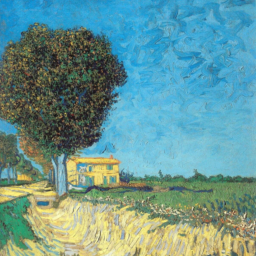

In [ ]:
for paintings in painting_loader:
  print(paintings.shape)
  display(transforms.ToPILImage()(scale_0_1(paintings[0])).convert('RGB'))
  break

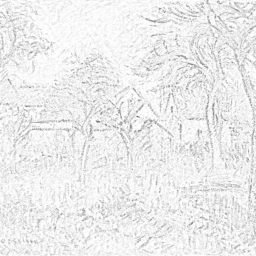

In [ ]:
# list(sketch_loader) returns a different list at every time it is called because of shuffle=True
display(transforms.ToPILImage()(scale_0_1(list(sketch_loader)[0].squeeze())).convert('RGB'))

# **Discriminator**

In [ ]:
class Discriminator(nn.Module):

    def __init__(self):
        super(Discriminator, self).__init__()

        #C64
        self.c64 = nn.Sequential(
          nn.Conv2d(3,64,(4,4), stride = (2,2), padding = 1),
          nn.LeakyReLU(0.2)
        )

        #C128
        self.c128 = nn.Sequential(
          nn.Conv2d(64,128,(4,4), stride = (2,2), padding = 1),
          nn.BatchNorm2d(128),
          nn.LeakyReLU(0.2)
        )

        #C256
        self.c256 = nn.Sequential(
          nn.Conv2d(128,256,(4,4), stride = (2,2), padding = 1),
          nn.BatchNorm2d(256),
          nn.LeakyReLU(0.2)
        )

        # Padding
        self.pad1 = nn.ZeroPad2d(1)

        #C512
        self.c512 = nn.Sequential(
          nn.Conv2d(256,512,(4,4), stride = (1,1)),
          nn.BatchNorm2d(512),
          nn.LeakyReLU(0.2)
        )

        # Padding
        self.pad2 = nn.ZeroPad2d(1)

        #Patch output
        self.critic = nn.Sequential(
             nn.Conv2d(512,1,(4,4), stride = (1,1))
        )

        #Weight initialization
        self.weight_init()



    def forward(self, sketch):

      x = self.c64(sketch)
      x = self.c128(x)
      x = self.c256(x)
      x = self.pad1(x)
      x = self.c512(x)
      x = self.pad2(x)

      out = self.critic(x)

      return out



    def weight_init(self):

      def normal_init(m):
        # Conv2d
        if isinstance(m, (nn.Conv2d)):
          m.weight.data.normal_(0.0, 0.02)
          if m.bias.data is not None:
            m.bias.data.zero_()
          print(m, ': Weights initialized')
        # BatchNorm2d
        elif isinstance(m, (nn.BatchNorm2d)):
          m.weight.data.normal_(1.0, 0.02)
          if m.bias.data is not None:
            m.bias.data.zero_()
          print(m, ': Weights initialized')

      for block in self._modules:
        try:
          for m in self._modules[block]:
            normal_init(m)
        except:
          pass

In [ ]:
#Discriminator Sketches
discriminatorS = Discriminator()
discriminatorS.to(device)

Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1)) : Weights initialized
Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1)) : Weights initialized
BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True) : Weights initialized
Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1)) : Weights initialized
BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True) : Weights initialized
Conv2d(256, 512, kernel_size=(4, 4), stride=(1, 1)) : Weights initialized
BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True) : Weights initialized
Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1)) : Weights initialized


Discriminator(
  (c64): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2)
  )
  (c128): Sequential(
    (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2)
  )
  (c256): Sequential(
    (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2)
  )
  (pad1): ZeroPad2d(padding=(1, 1, 1, 1), value=0.0)
  (c512): Sequential(
    (0): Conv2d(256, 512, kernel_size=(4, 4), stride=(1, 1))
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2)
  )
  (pad2): ZeroPad2d(padding=(1, 1, 1, 1), value=0.0)
  (critic): Sequential(
    (0): Conv2d(512, 1, kernel_size=(4

In [ ]:
#Discriminator Paintings
discriminatorP = Discriminator()
discriminatorP.to(device)

Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1)) : Weights initialized
Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1)) : Weights initialized
BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True) : Weights initialized
Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1)) : Weights initialized
BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True) : Weights initialized
Conv2d(256, 512, kernel_size=(4, 4), stride=(1, 1)) : Weights initialized
BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True) : Weights initialized
Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1)) : Weights initialized


Discriminator(
  (c64): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2)
  )
  (c128): Sequential(
    (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2)
  )
  (c256): Sequential(
    (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2)
  )
  (pad1): ZeroPad2d(padding=(1, 1, 1, 1), value=0.0)
  (c512): Sequential(
    (0): Conv2d(256, 512, kernel_size=(4, 4), stride=(1, 1))
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2)
  )
  (pad2): ZeroPad2d(padding=(1, 1, 1, 1), value=0.0)
  (critic): Sequential(
    (0): Conv2d(512, 1, kernel_size=(4

In [ ]:
# Testing output shape
#out = discriminatorS(ds_van_gogh_sketches[:4].to(device))
#print(out.shape)

#out = discriminatorP(ds_paintings[:4].to(device))
#print(out.shape)

torch.Size([4, 1, 30, 30])
torch.Size([4, 1, 30, 30])


# **Generator**

In [ ]:
class Generator(nn.Module):

  def __init__(self):     #(N,3,256,256)
    super(Generator, self).__init__()

    self.c7s1_64 = nn.Sequential(
        nn.ReflectionPad2d(3),
        nn.Conv2d(3, 64, 7, 1, 0),
        nn.InstanceNorm2d(64),
        nn.ReLU(True)
    )

    self.d128 = nn.Sequential(
        nn.Conv2d(64, 128, 3, 2, 1),
        nn.InstanceNorm2d(128),
        nn.ReLU(True)
    )

    self.d256 = nn.Sequential(
        nn.Conv2d(128, 256, 3, 2, 1),
        nn.InstanceNorm2d(256),
        nn.ReLU(True)
    )

    self.r256_1 = nn.Sequential(
        nn.ReflectionPad2d(1),
        nn.Conv2d(256, 256, 3, 1, 0),
        nn.InstanceNorm2d(256),
        nn.ReLU(True),
        nn.ReflectionPad2d(1),
        nn.Conv2d(256, 256, 3, 1, 0),
        nn.InstanceNorm2d(256)
    )

    self.r256_2 = nn.Sequential(
        nn.ReflectionPad2d(1),
        nn.Conv2d(256, 256, 3, 1, 0),
        nn.InstanceNorm2d(256),
        nn.ReLU(True),
        nn.ReflectionPad2d(1),
        nn.Conv2d(256, 256, 3, 1, 0),
        nn.InstanceNorm2d(256)
    )

    self.r256_3 = nn.Sequential(
        nn.ReflectionPad2d(1),
        nn.Conv2d(256, 256, 3, 1, 0),
        nn.InstanceNorm2d(256),
        nn.ReLU(True),
        nn.ReflectionPad2d(1),
        nn.Conv2d(256, 256, 3, 1, 0),
        nn.InstanceNorm2d(256)
    )

    self.r256_4 = nn.Sequential(
        nn.ReflectionPad2d(1),
        nn.Conv2d(256, 256, 3, 1, 0),
        nn.InstanceNorm2d(256),
        nn.ReLU(True),
        nn.ReflectionPad2d(1),
        nn.Conv2d(256, 256, 3, 1, 0),
        nn.InstanceNorm2d(256)
    )

    self.r256_5 = nn.Sequential(
        nn.ReflectionPad2d(1),
        nn.Conv2d(256, 256, 3, 1, 0),
        nn.InstanceNorm2d(256),
        nn.ReLU(True),
        nn.ReflectionPad2d(1),
        nn.Conv2d(256, 256, 3, 1, 0),
        nn.InstanceNorm2d(256)
    )

    self.r256_6 = nn.Sequential(
        nn.ReflectionPad2d(1),
        nn.Conv2d(256, 256, 3, 1, 0),
        nn.InstanceNorm2d(256),
        nn.ReLU(True),
        nn.ReflectionPad2d(1),
        nn.Conv2d(256, 256, 3, 1, 0),
        nn.InstanceNorm2d(256)
    )

    self.r256_7 = nn.Sequential(
        nn.ReflectionPad2d(1),
        nn.Conv2d(256, 256, 3, 1, 0),
        nn.InstanceNorm2d(256),
        nn.ReLU(True),
        nn.ReflectionPad2d(1),
        nn.Conv2d(256, 256, 3, 1, 0),
        nn.InstanceNorm2d(256)
    )

    self.r256_8 = nn.Sequential(
        nn.ReflectionPad2d(1),
        nn.Conv2d(256, 256, 3, 1, 0),
        nn.InstanceNorm2d(256),
        nn.ReLU(True),
        nn.ReflectionPad2d(1),
        nn.Conv2d(256, 256, 3, 1, 0),
        nn.InstanceNorm2d(256)
    )

    self.r256_9 = nn.Sequential(
        nn.ReflectionPad2d(1),
        nn.Conv2d(256, 256, 3, 1, 0),
        nn.InstanceNorm2d(256),
        nn.ReLU(True),
        nn.ReflectionPad2d(1),
        nn.Conv2d(256, 256, 3, 1, 0),
        nn.InstanceNorm2d(256)
    )

    self.u128 = nn.Sequential(
        nn.ConvTranspose2d(256, 128, 3, 2, 1, output_padding=1),
        nn.InstanceNorm2d(128),
        nn.ReLU(True)
    )

    self.u64 = nn.Sequential(
        nn.ConvTranspose2d(128, 64, 3, 2, 1, output_padding=1),
        nn.InstanceNorm2d(64),
        nn.ReLU(True)
    )

    self.c7s1_3 = nn.Sequential(
        nn.ReflectionPad2d(3),
        nn.Conv2d(64, 3, 7, 1, 0),
        nn.Tanh()
    )

    self.weight_init()



  def forward(self, input):
    x = self.c7s1_64(input)

    x = self.d128(x)
    x = self.d256(x)

    x = self.r256_1(x) + x
    x = self.r256_2(x) + x
    x = self.r256_3(x) + x
    x = self.r256_4(x) + x
    x = self.r256_5(x) + x
    x = self.r256_6(x) + x
    x = self.r256_7(x) + x
    x = self.r256_8(x) + x
    x = self.r256_9(x) + x

    x = self.u128(x)
    x = self.u64(x)

    out = self.c7s1_3(x)

    return out



  def weight_init(self):

    def normal_init(m):
      # Conv2d, ConvTranspose2d
      if isinstance(m, (nn.Conv2d, nn.ConvTranspose2d)):
        m.weight.data.normal_(0.0, 0.02)
        if m.bias.data is not None:
          m.bias.data.zero_()
        print(m, ': Weights initialized')

    for block in self._modules:
      try:
        for m in self._modules[block]:
          normal_init(m)
      except:
        pass

In [ ]:
#Generator Sketch -> Painting
generatorS2P = Generator()
generatorS2P.to(device)

Conv2d(3, 64, kernel_size=(7, 7), stride=(1, 1)) : Weights initialized
Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1)) : Weights initialized
Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1)) : Weights initialized
Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1)) : Weights initialized
Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1)) : Weights initialized
Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1)) : Weights initialized
Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1)) : Weights initialized
Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1)) : Weights initialized
Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1)) : Weights initialized
Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1)) : Weights initialized
Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1)) : Weights initialized
Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1)) : Weights initialized
Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1)) : Weights initialized
Conv2d(256

Generator(
  (c7s1_64): Sequential(
    (0): ReflectionPad2d((3, 3, 3, 3))
    (1): Conv2d(3, 64, kernel_size=(7, 7), stride=(1, 1))
    (2): InstanceNorm2d(64, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (3): ReLU(inplace=True)
  )
  (d128): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): InstanceNorm2d(128, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (2): ReLU(inplace=True)
  )
  (d256): Sequential(
    (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (2): ReLU(inplace=True)
  )
  (r256_1): Sequential(
    (0): ReflectionPad2d((1, 1, 1, 1))
    (1): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1))
    (2): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (3): ReLU(inplace=True)
    (4): ReflectionPad2d((1, 1, 1, 1))
    

In [ ]:
#Generator Painting -> Sketch
generatorP2S = Generator()
generatorP2S.to(device)

Conv2d(3, 64, kernel_size=(7, 7), stride=(1, 1)) : Weights initialized
Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1)) : Weights initialized
Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1)) : Weights initialized
Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1)) : Weights initialized
Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1)) : Weights initialized
Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1)) : Weights initialized
Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1)) : Weights initialized
Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1)) : Weights initialized
Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1)) : Weights initialized
Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1)) : Weights initialized
Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1)) : Weights initialized
Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1)) : Weights initialized
Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1)) : Weights initialized
Conv2d(256

Generator(
  (c7s1_64): Sequential(
    (0): ReflectionPad2d((3, 3, 3, 3))
    (1): Conv2d(3, 64, kernel_size=(7, 7), stride=(1, 1))
    (2): InstanceNorm2d(64, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (3): ReLU(inplace=True)
  )
  (d128): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): InstanceNorm2d(128, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (2): ReLU(inplace=True)
  )
  (d256): Sequential(
    (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (2): ReLU(inplace=True)
  )
  (r256_1): Sequential(
    (0): ReflectionPad2d((1, 1, 1, 1))
    (1): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1))
    (2): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (3): ReLU(inplace=True)
    (4): ReflectionPad2d((1, 1, 1, 1))
    

In [ ]:
#print(generatorS2P(ds_van_gogh_sketches[:4].to(device)).shape)
#print(generatorP2S(ds_paintings[:4].to(device)).shape)

torch.Size([4, 3, 256, 256])
torch.Size([4, 3, 256, 256])


# Training

In [ ]:
# Reload the models from last checkpoint

CHECKPOINTS_FOLDER = PATH+'/CycleGAN_Checkpoints'

#epoch = 0
#generatorS2P.load_state_dict(torch.load(CHECKPOINTS_FOLDER+'/generatorS2P_{}.ckpt'.format(epoch), map_location=torch.device(device)))
#generatorP2S.load_state_dict(torch.load(CHECKPOINTS_FOLDER+'/generatorP2S_{}.ckpt'.format(epoch), map_location=torch.device(device)))
#discriminatorS.load_state_dict(torch.load(CHECKPOINTS_FOLDER+'/discriminatorS_{}.ckpt'.format(epoch), map_location=torch.device(device)))
#discriminatorP.load_state_dict(torch.load(CHECKPOINTS_FOLDER+'/discriminatorP_{}.ckpt'.format(epoch), map_location=torch.device(device)))

In [ ]:
# Optimizers and criterions

learnig_rate = 2e-4

generator_optimizer = torch.optim.Adam(itertools.chain(generatorS2P.parameters(), generatorP2S.parameters()), lr=learnig_rate, betas=(0.5, 0.999))
discriminator_optimizer = torch.optim.Adam(itertools.chain(discriminatorS.parameters(), discriminatorP.parameters()), lr=learnig_rate, betas=(0.5, 0.999))

criterion_L1 = nn.L1Loss().to(device)
criterion_MSE = nn.MSELoss().to(device)

In [ ]:
def make_trainable(net, val):
  for param in net.parameters():
    param.requires_grad = val

In [ ]:
IMAGES_FOLDER = PATH+'/CycleGAN_Images'

def generate_and_save_image(generator, epoch, img, save):
  pred = scale_0_1(generator(img).squeeze())
  image = transforms.ToPILImage()(pred).convert('RGB')
  display(image)
  if save:
    image.save(IMAGES_FOLDER+'/sketch_epoch_'+str(epoch)+'.jpg')

In [ ]:
#STATS_FILE = PATH+'/CycleGAN_stats.csv'

#with open(STATS_FILE, 'w', newline='') as stats_file:
  #writer = csv.writer(stats_file)
  #writer.writerow(['epoch_number', 'discriminators_loss', 'generators_loss'])

In [ ]:
class FakeBuffer:
    def __init__(self, max_size=50):
        assert (max_size > 0), "Empty buffer or trying to create a black hole. Be careful."
        self.max_size = max_size
        self.data = []

    def push_and_pop(self, data):
        to_return = []
        for element in data.data:
            element = torch.unsqueeze(element, 0)
            if len(self.data) < self.max_size:
                self.data.append(element)
                to_return.append(element)
            else:
                if random.uniform(0, 1) > 0.5:
                    i = random.randint(0, self.max_size - 1)
                    to_return.append(self.data[i].clone())
                    self.data[i] = element
                else:
                    to_return.append(element)
        return torch.cat(to_return)

In [ ]:
EPOCHS = 20
STATS_FILE = PATH+'/CycleGAN_stats.csv'

def train(generatorS2P, generatorP2S, discriminatorS, discriminatorP, painting_loader, sketch_loader, last_epoch):
  total_step = len(painting_loader)
  fake_sketch_buffer = FakeBuffer()
  fake_painting_buffer = FakeBuffer()

  for epoch in range(last_epoch, last_epoch+EPOCHS):
    start = time.time()

    # Computing the losses at the end of the epoch
    generator_losses = []
    discriminator_losses = []

    # Random pool of sketches used for this epoch
    sketches = list(sketch_loader)[:len(ds_paintings)]

    for (i, painting) in enumerate(painting_loader):
      painting = painting.to(device)
      sketch = sketches[i].to(device)

      fake_label = torch.zeros((BATCH_SIZE, 1, 30, 30), device=device).float()
      real_label = torch.ones((BATCH_SIZE, 1, 30, 30), device=device).float()

      # ================================================================== #
      #                      Train Generators                              #
      # ================================================================== #

      make_trainable(discriminatorS, False)
      make_trainable(discriminatorP, False)
      generator_optimizer.zero_grad()

      # Forward pass through generators
      fake_sketch = generatorP2S(painting)
      fake_painting = generatorS2P(sketch)
      recover_sketch = generatorP2S(fake_painting)
      recover_painting = generatorS2P(fake_sketch)

      # Identity losses
      identity_sketch = generatorP2S(sketch)
      identity_painting = generatorS2P(painting)
      loss_identity_sketch = 5*criterion_L1(identity_sketch, sketch)
      loss_identity_painting = 5*criterion_L1(identity_painting, painting)

      # Adversarial losses
      fake_output_sketch = discriminatorS(fake_sketch)
      fake_output_painting = discriminatorP(fake_painting)
      adversarial_loss_P2S = criterion_MSE(fake_output_sketch, real_label)
      adversarial_loss_S2P = criterion_MSE(fake_output_painting, real_label)

      # Cycle consistency losses
      loss_cycle_SPS = 10*criterion_L1(recover_sketch, sketch)
      loss_cycle_PSP = 10*criterion_L1(recover_painting, painting)

      # Total generators losses and Update
      generator_loss = adversarial_loss_P2S + adversarial_loss_S2P + loss_cycle_SPS + loss_cycle_PSP + loss_identity_sketch + loss_identity_painting
      generator_losses.append(generator_loss.item())
      generator_loss.backward()
      #scheduler_generator.step()
      generator_optimizer.step()

      # ================================================================== #
      #                 Train Discriminators                               #
      # ================================================================== #

      make_trainable(discriminatorS, True)
      make_trainable(discriminatorP, True)
      discriminator_optimizer.zero_grad()

      # Sample from history of generated images
      fake_sketch = fake_sketch_buffer.push_and_pop(fake_sketch)
      fake_painting = fake_painting_buffer.push_and_pop(fake_painting)

      # Forward pass through discriminators
      real_output_sketch = discriminatorS(sketch)
      fake_output_sketch = discriminatorS(fake_sketch.detach())
      real_output_painting = discriminatorP(painting)
      fake_output_painting = discriminatorP(fake_painting.detach())

      # Discriminator losses
      real_sketch_loss = criterion_MSE(real_output_sketch, real_label)
      fake_sketch_loss = criterion_MSE(fake_output_sketch, fake_label)
      real_painting_loss = criterion_MSE(real_output_painting, real_label)
      fake_painting_loss = criterion_MSE(fake_output_painting, fake_label)

      # Total discriminators losses and Update
      discriminatorS_loss = 0.5*(real_sketch_loss + fake_sketch_loss)
      discriminatorP_loss = 0.5*(real_painting_loss + fake_painting_loss)
      discriminator_loss = discriminatorS_loss + discriminatorP_loss
      discriminator_losses.append(discriminator_loss.item())
      discriminatorS_loss.backward()
      discriminatorP_loss.backward()
      #scheduler_discriminator.step()
      discriminator_optimizer.step()

      # Check periodically the losses on one batch
      if (i+1) % 50 == 0:
        print('Epoch [{}/{}], Step [{}/{}], Discriminators Loss [{:.3f}], Generators Loss [{:.3f}]'.format(epoch+1, last_epoch+EPOCHS, i+1, total_step, discriminator_loss.item(), generator_loss.item()))

    # ================================================================== #
    #                      Validate GeneratorS2P                         #
    # ================================================================== #

    with torch.no_grad():
      elem = random.randint(0, len(ds_sketches)-1)
      generate_and_save_image(generatorS2P, epoch+1, torch.unsqueeze(ds_sketches[elem], 0).to(device), True)
      elem = random.randint(0, len(ds_paintings)-1)
      generate_and_save_image(generatorP2S, epoch+1, torch.unsqueeze(ds_paintings[elem], 0).to(device), False)

    discriminator_loss = np.mean(discriminator_losses)
    generator_loss = np.mean(generator_losses)
    print ('Time for epoch {} is {:.2f} sec'.format(epoch + 1, time.time()-start))
    print('Epoch: [{}/{}]...'.format(epoch+1, last_epoch+EPOCHS), 'Discriminators Loss: [{:.3f}]...'.format(discriminator_loss), 'Generators Loss: [{:.3f}]...'.format(generator_loss))
    with open(STATS_FILE, 'a', newline='') as stats_file:
      writer = csv.writer(stats_file)
      writer.writerow([epoch+1, '%.3f'%(discriminator_loss), '%.3f'%(generator_loss)])

    # Save periodically the models
    #if (epoch+1) % 5 == 0:
    torch.save(discriminatorS.state_dict(), CHECKPOINTS_FOLDER+'/discriminatorS_{}.ckpt'.format(epoch+1))
    torch.save(discriminatorP.state_dict(), CHECKPOINTS_FOLDER+'/discriminatorP_{}.ckpt'.format(epoch+1))
    torch.save(generatorP2S.state_dict(), CHECKPOINTS_FOLDER+'/generatorP2S_{}.ckpt'.format(epoch+1))
    torch.save(generatorS2P.state_dict(), CHECKPOINTS_FOLDER+'/generatorS2P_{}.ckpt'.format(epoch+1))
    print('Epoch: [{}/{}]... Saving models...'.format(epoch+1, last_epoch+EPOCHS))

    print('# ======================================================================================================================= #')

#### Epochs: 0 -> 20

In [ ]:
# IMPORTANT >>>>>> Set last_epoch of the LAST CHECKPOINT
train(generatorS2P, generatorP2S, discriminatorS, discriminatorP, painting_loader, sketch_loader, last_epoch=0)

#### Epochs: 20 -> 40

In [ ]:
# Reload the models from last checkpoint

CHECKPOINTS_FOLDER = PATH+'/CycleGAN_Checkpoints'

epoch = 20
generatorS2P.load_state_dict(torch.load(CHECKPOINTS_FOLDER+'/generatorS2P_{}.ckpt'.format(epoch), map_location=torch.device(device)))
generatorP2S.load_state_dict(torch.load(CHECKPOINTS_FOLDER+'/generatorP2S_{}.ckpt'.format(epoch), map_location=torch.device(device)))
discriminatorS.load_state_dict(torch.load(CHECKPOINTS_FOLDER+'/discriminatorS_{}.ckpt'.format(epoch), map_location=torch.device(device)))
discriminatorP.load_state_dict(torch.load(CHECKPOINTS_FOLDER+'/discriminatorP_{}.ckpt'.format(epoch), map_location=torch.device(device)))


# Optimizers and criterions

learnig_rate = 2e-4

generator_optimizer = torch.optim.Adam(itertools.chain(generatorS2P.parameters(), generatorP2S.parameters()), lr=learnig_rate, betas=(0.5, 0.999))
discriminator_optimizer = torch.optim.Adam(itertools.chain(discriminatorS.parameters(), discriminatorP.parameters()), lr=learnig_rate, betas=(0.5, 0.999))

criterion_L1 = nn.L1Loss().to(device)
criterion_MSE = nn.MSELoss().to(device)

In [ ]:
# IMPORTANT >>>>>> Set last_epoch of the LAST CHECKPOINT
train(generatorS2P, generatorP2S, discriminatorS, discriminatorP, painting_loader, sketch_loader, last_epoch=20)

#### Epochs: 40 -> 60

In [ ]:
# Reload the models from last checkpoint

CHECKPOINTS_FOLDER = PATH+'/CycleGAN_Checkpoints'

epoch = 40
generatorS2P.load_state_dict(torch.load(CHECKPOINTS_FOLDER+'/generatorS2P_{}.ckpt'.format(epoch), map_location=torch.device(device)))
generatorP2S.load_state_dict(torch.load(CHECKPOINTS_FOLDER+'/generatorP2S_{}.ckpt'.format(epoch), map_location=torch.device(device)))
discriminatorS.load_state_dict(torch.load(CHECKPOINTS_FOLDER+'/discriminatorS_{}.ckpt'.format(epoch), map_location=torch.device(device)))
discriminatorP.load_state_dict(torch.load(CHECKPOINTS_FOLDER+'/discriminatorP_{}.ckpt'.format(epoch), map_location=torch.device(device)))


# Optimizers and criterions

learnig_rate = 2e-4

generator_optimizer = torch.optim.Adam(itertools.chain(generatorS2P.parameters(), generatorP2S.parameters()), lr=learnig_rate, betas=(0.5, 0.999))
discriminator_optimizer = torch.optim.Adam(itertools.chain(discriminatorS.parameters(), discriminatorP.parameters()), lr=learnig_rate, betas=(0.5, 0.999))

criterion_L1 = nn.L1Loss().to(device)
criterion_MSE = nn.MSELoss().to(device)

In [ ]:
# IMPORTANT >>>>>> Set last_epoch of the LAST CHECKPOINT
train(generatorS2P, generatorP2S, discriminatorS, discriminatorP, painting_loader, sketch_loader, last_epoch=40)

#### Epochs: 60 -> 80

In [ ]:
# Reload the models from last checkpoint

CHECKPOINTS_FOLDER = PATH+'/CycleGAN_Checkpoints'

epoch = 60
generatorS2P.load_state_dict(torch.load(CHECKPOINTS_FOLDER+'/generatorS2P_{}.ckpt'.format(epoch), map_location=torch.device(device)))
generatorP2S.load_state_dict(torch.load(CHECKPOINTS_FOLDER+'/generatorP2S_{}.ckpt'.format(epoch), map_location=torch.device(device)))
discriminatorS.load_state_dict(torch.load(CHECKPOINTS_FOLDER+'/discriminatorS_{}.ckpt'.format(epoch), map_location=torch.device(device)))
discriminatorP.load_state_dict(torch.load(CHECKPOINTS_FOLDER+'/discriminatorP_{}.ckpt'.format(epoch), map_location=torch.device(device)))


# Optimizers and criterions

learnig_rate = 2e-4

generator_optimizer = torch.optim.Adam(itertools.chain(generatorS2P.parameters(), generatorP2S.parameters()), lr=learnig_rate, betas=(0.5, 0.999))
discriminator_optimizer = torch.optim.Adam(itertools.chain(discriminatorS.parameters(), discriminatorP.parameters()), lr=learnig_rate, betas=(0.5, 0.999))

criterion_L1 = nn.L1Loss().to(device)
criterion_MSE = nn.MSELoss().to(device)

Epoch [61/80], Step [50/344], Discriminators Loss [0.244], Generators Loss [3.106]
Epoch [61/80], Step [100/344], Discriminators Loss [0.547], Generators Loss [3.749]
Epoch [61/80], Step [150/344], Discriminators Loss [0.126], Generators Loss [3.262]
Epoch [61/80], Step [200/344], Discriminators Loss [0.376], Generators Loss [4.193]
Epoch [61/80], Step [250/344], Discriminators Loss [0.320], Generators Loss [3.596]
Epoch [61/80], Step [300/344], Discriminators Loss [0.108], Generators Loss [4.783]


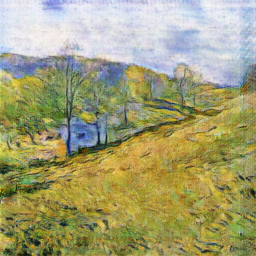

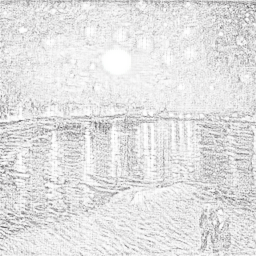

Time for epoch 61 is 236.45 sec
Epoch: [61/80]... Discriminators Loss: [0.245]... Generators Loss: [3.441]...
# ======================================================================================================================= #
Epoch [62/80], Step [50/344], Discriminators Loss [0.093], Generators Loss [2.151]
Epoch [62/80], Step [100/344], Discriminators Loss [0.357], Generators Loss [3.578]
Epoch [62/80], Step [150/344], Discriminators Loss [0.157], Generators Loss [2.942]
Epoch [62/80], Step [200/344], Discriminators Loss [0.290], Generators Loss [3.399]
Epoch [62/80], Step [250/344], Discriminators Loss [0.370], Generators Loss [4.004]
Epoch [62/80], Step [300/344], Discriminators Loss [0.245], Generators Loss [3.134]


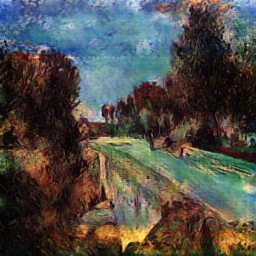

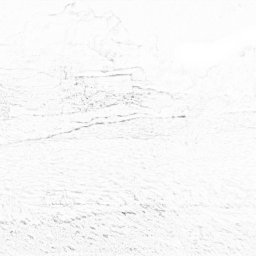

Time for epoch 62 is 236.73 sec
Epoch: [62/80]... Discriminators Loss: [0.263]... Generators Loss: [3.295]...
# ======================================================================================================================= #
Epoch [63/80], Step [50/344], Discriminators Loss [0.221], Generators Loss [2.617]
Epoch [63/80], Step [100/344], Discriminators Loss [0.599], Generators Loss [2.667]
Epoch [63/80], Step [150/344], Discriminators Loss [0.184], Generators Loss [4.075]
Epoch [63/80], Step [200/344], Discriminators Loss [0.460], Generators Loss [3.239]
Epoch [63/80], Step [250/344], Discriminators Loss [0.204], Generators Loss [3.899]
Epoch [63/80], Step [300/344], Discriminators Loss [0.169], Generators Loss [4.139]


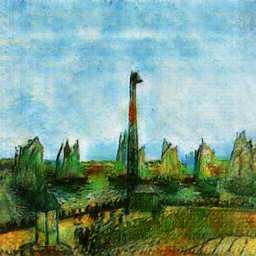

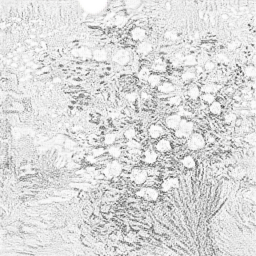

Time for epoch 63 is 236.64 sec
Epoch: [63/80]... Discriminators Loss: [0.257]... Generators Loss: [3.386]...
# ======================================================================================================================= #
Epoch [64/80], Step [50/344], Discriminators Loss [0.167], Generators Loss [2.566]
Epoch [64/80], Step [100/344], Discriminators Loss [0.268], Generators Loss [2.820]
Epoch [64/80], Step [150/344], Discriminators Loss [0.398], Generators Loss [2.821]
Epoch [64/80], Step [200/344], Discriminators Loss [0.245], Generators Loss [2.744]
Epoch [64/80], Step [250/344], Discriminators Loss [0.121], Generators Loss [2.867]
Epoch [64/80], Step [300/344], Discriminators Loss [0.251], Generators Loss [3.895]


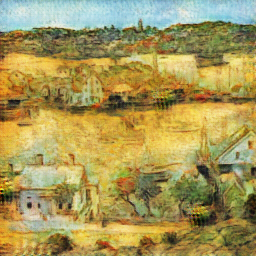

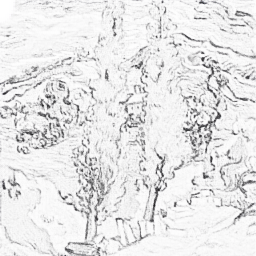

Time for epoch 64 is 236.68 sec
Epoch: [64/80]... Discriminators Loss: [0.258]... Generators Loss: [3.267]...
# ======================================================================================================================= #
Epoch [65/80], Step [50/344], Discriminators Loss [0.322], Generators Loss [3.194]
Epoch [65/80], Step [100/344], Discriminators Loss [0.194], Generators Loss [3.201]
Epoch [65/80], Step [150/344], Discriminators Loss [0.510], Generators Loss [3.989]
Epoch [65/80], Step [200/344], Discriminators Loss [0.115], Generators Loss [3.139]
Epoch [65/80], Step [250/344], Discriminators Loss [0.315], Generators Loss [2.971]
Epoch [65/80], Step [300/344], Discriminators Loss [0.291], Generators Loss [3.101]


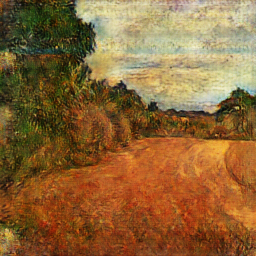

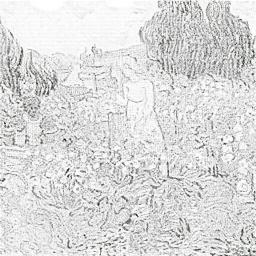

Time for epoch 65 is 236.74 sec
Epoch: [65/80]... Discriminators Loss: [0.252]... Generators Loss: [3.334]...
Epoch: [65/80]... Saving models...
# ======================================================================================================================= #
Epoch [66/80], Step [50/344], Discriminators Loss [0.142], Generators Loss [3.825]
Epoch [66/80], Step [100/344], Discriminators Loss [0.131], Generators Loss [3.179]
Epoch [66/80], Step [150/344], Discriminators Loss [0.103], Generators Loss [2.730]
Epoch [66/80], Step [200/344], Discriminators Loss [0.761], Generators Loss [2.581]
Epoch [66/80], Step [250/344], Discriminators Loss [0.491], Generators Loss [4.139]
Epoch [66/80], Step [300/344], Discriminators Loss [0.376], Generators Loss [3.544]


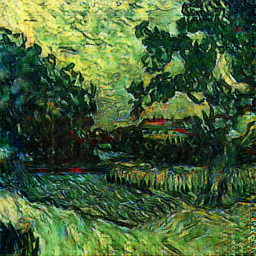

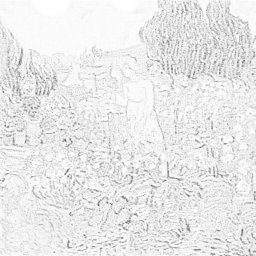

Time for epoch 66 is 236.91 sec
Epoch: [66/80]... Discriminators Loss: [0.246]... Generators Loss: [3.346]...
# ======================================================================================================================= #
Epoch [67/80], Step [50/344], Discriminators Loss [0.176], Generators Loss [3.548]
Epoch [67/80], Step [100/344], Discriminators Loss [0.102], Generators Loss [2.978]
Epoch [67/80], Step [150/344], Discriminators Loss [0.141], Generators Loss [2.737]
Epoch [67/80], Step [200/344], Discriminators Loss [0.075], Generators Loss [3.359]
Epoch [67/80], Step [250/344], Discriminators Loss [0.569], Generators Loss [2.939]
Epoch [67/80], Step [300/344], Discriminators Loss [0.293], Generators Loss [2.835]


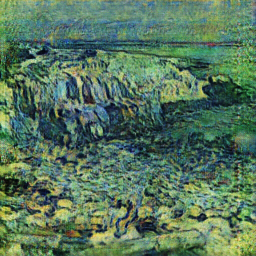

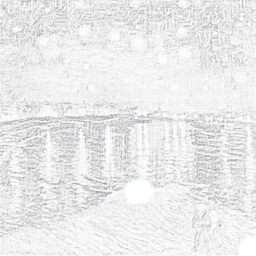

Time for epoch 67 is 236.65 sec
Epoch: [67/80]... Discriminators Loss: [0.266]... Generators Loss: [3.264]...
# ======================================================================================================================= #
Epoch [68/80], Step [50/344], Discriminators Loss [0.169], Generators Loss [3.951]
Epoch [68/80], Step [100/344], Discriminators Loss [0.264], Generators Loss [3.475]
Epoch [68/80], Step [150/344], Discriminators Loss [0.204], Generators Loss [3.850]
Epoch [68/80], Step [200/344], Discriminators Loss [0.319], Generators Loss [3.910]
Epoch [68/80], Step [250/344], Discriminators Loss [0.150], Generators Loss [3.272]
Epoch [68/80], Step [300/344], Discriminators Loss [0.206], Generators Loss [3.935]


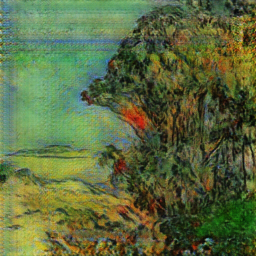

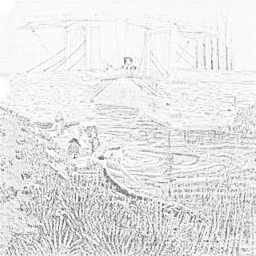

Time for epoch 68 is 236.68 sec
Epoch: [68/80]... Discriminators Loss: [0.271]... Generators Loss: [3.249]...
# ======================================================================================================================= #
Epoch [69/80], Step [50/344], Discriminators Loss [0.175], Generators Loss [3.661]
Epoch [69/80], Step [100/344], Discriminators Loss [0.178], Generators Loss [2.922]
Epoch [69/80], Step [150/344], Discriminators Loss [0.151], Generators Loss [3.625]
Epoch [69/80], Step [200/344], Discriminators Loss [0.362], Generators Loss [2.618]
Epoch [69/80], Step [250/344], Discriminators Loss [0.393], Generators Loss [2.653]
Epoch [69/80], Step [300/344], Discriminators Loss [0.201], Generators Loss [4.067]


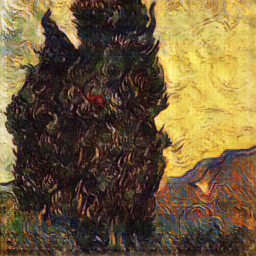

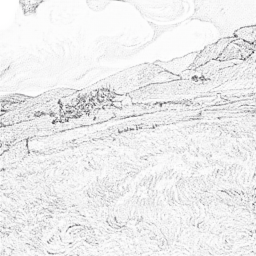

Time for epoch 69 is 236.83 sec
Epoch: [69/80]... Discriminators Loss: [0.236]... Generators Loss: [3.364]...
# ======================================================================================================================= #
Epoch [70/80], Step [50/344], Discriminators Loss [0.226], Generators Loss [3.379]
Epoch [70/80], Step [100/344], Discriminators Loss [0.276], Generators Loss [2.992]
Epoch [70/80], Step [150/344], Discriminators Loss [0.263], Generators Loss [3.152]
Epoch [70/80], Step [200/344], Discriminators Loss [0.484], Generators Loss [2.946]
Epoch [70/80], Step [250/344], Discriminators Loss [0.412], Generators Loss [3.346]
Epoch [70/80], Step [300/344], Discriminators Loss [0.245], Generators Loss [4.144]


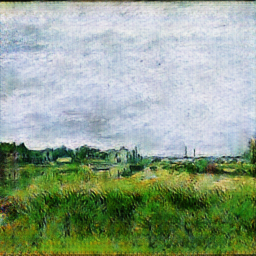

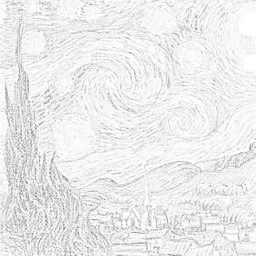

Time for epoch 70 is 236.60 sec
Epoch: [70/80]... Discriminators Loss: [0.269]... Generators Loss: [3.215]...
Epoch: [70/80]... Saving models...
# ======================================================================================================================= #
Epoch [71/80], Step [50/344], Discriminators Loss [0.277], Generators Loss [2.644]
Epoch [71/80], Step [100/344], Discriminators Loss [0.211], Generators Loss [2.305]
Epoch [71/80], Step [150/344], Discriminators Loss [0.271], Generators Loss [2.671]
Epoch [71/80], Step [200/344], Discriminators Loss [0.469], Generators Loss [2.102]
Epoch [71/80], Step [250/344], Discriminators Loss [0.386], Generators Loss [2.580]
Epoch [71/80], Step [300/344], Discriminators Loss [0.286], Generators Loss [3.400]


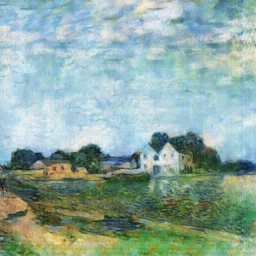

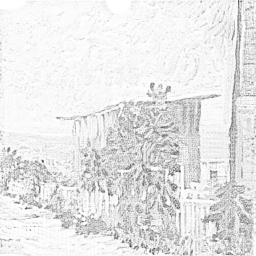

Time for epoch 71 is 237.00 sec
Epoch: [71/80]... Discriminators Loss: [0.289]... Generators Loss: [3.234]...
# ======================================================================================================================= #
Epoch [72/80], Step [50/344], Discriminators Loss [0.518], Generators Loss [2.805]
Epoch [72/80], Step [100/344], Discriminators Loss [0.264], Generators Loss [3.290]
Epoch [72/80], Step [150/344], Discriminators Loss [0.219], Generators Loss [3.339]
Epoch [72/80], Step [200/344], Discriminators Loss [0.225], Generators Loss [3.087]
Epoch [72/80], Step [250/344], Discriminators Loss [0.229], Generators Loss [3.332]
Epoch [72/80], Step [300/344], Discriminators Loss [0.216], Generators Loss [3.634]


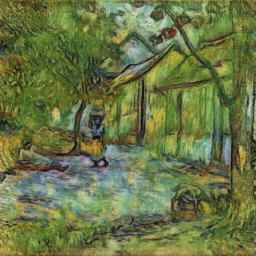

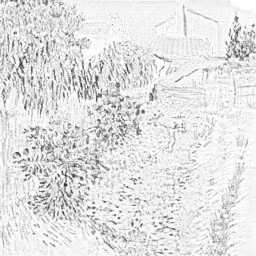

Time for epoch 72 is 236.60 sec
Epoch: [72/80]... Discriminators Loss: [0.286]... Generators Loss: [3.188]...
# ======================================================================================================================= #
Epoch [73/80], Step [50/344], Discriminators Loss [0.336], Generators Loss [2.866]
Epoch [73/80], Step [100/344], Discriminators Loss [0.122], Generators Loss [3.616]
Epoch [73/80], Step [150/344], Discriminators Loss [0.281], Generators Loss [3.661]
Epoch [73/80], Step [200/344], Discriminators Loss [0.174], Generators Loss [2.983]
Epoch [73/80], Step [250/344], Discriminators Loss [0.459], Generators Loss [4.276]
Epoch [73/80], Step [300/344], Discriminators Loss [0.163], Generators Loss [3.314]


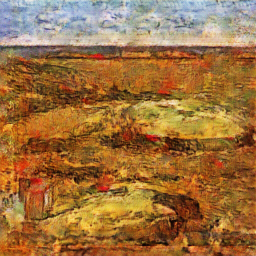

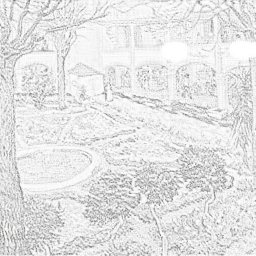

Time for epoch 73 is 236.91 sec
Epoch: [73/80]... Discriminators Loss: [0.261]... Generators Loss: [3.355]...
# ======================================================================================================================= #
Epoch [74/80], Step [50/344], Discriminators Loss [0.258], Generators Loss [2.714]
Epoch [74/80], Step [100/344], Discriminators Loss [0.259], Generators Loss [3.025]
Epoch [74/80], Step [150/344], Discriminators Loss [0.093], Generators Loss [3.289]
Epoch [74/80], Step [200/344], Discriminators Loss [0.380], Generators Loss [3.225]
Epoch [74/80], Step [250/344], Discriminators Loss [0.144], Generators Loss [3.225]
Epoch [74/80], Step [300/344], Discriminators Loss [0.074], Generators Loss [3.546]


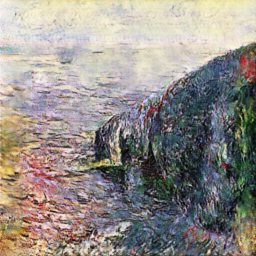

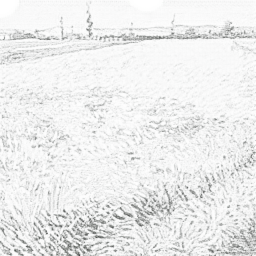

Time for epoch 74 is 236.94 sec
Epoch: [74/80]... Discriminators Loss: [0.212]... Generators Loss: [3.463]...
# ======================================================================================================================= #
Epoch [75/80], Step [50/344], Discriminators Loss [0.118], Generators Loss [3.324]
Epoch [75/80], Step [100/344], Discriminators Loss [0.123], Generators Loss [3.736]
Epoch [75/80], Step [150/344], Discriminators Loss [0.304], Generators Loss [2.690]
Epoch [75/80], Step [200/344], Discriminators Loss [0.239], Generators Loss [2.779]
Epoch [75/80], Step [250/344], Discriminators Loss [0.246], Generators Loss [2.545]
Epoch [75/80], Step [300/344], Discriminators Loss [0.100], Generators Loss [3.303]


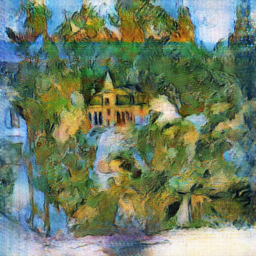

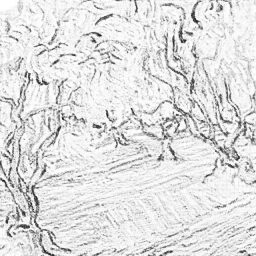

Time for epoch 75 is 236.81 sec
Epoch: [75/80]... Discriminators Loss: [0.236]... Generators Loss: [3.325]...
Epoch: [75/80]... Saving models...
# ======================================================================================================================= #
Epoch [76/80], Step [50/344], Discriminators Loss [0.528], Generators Loss [2.614]
Epoch [76/80], Step [100/344], Discriminators Loss [0.277], Generators Loss [3.664]
Epoch [76/80], Step [150/344], Discriminators Loss [0.375], Generators Loss [3.036]
Epoch [76/80], Step [200/344], Discriminators Loss [0.194], Generators Loss [4.045]
Epoch [76/80], Step [250/344], Discriminators Loss [0.290], Generators Loss [3.044]
Epoch [76/80], Step [300/344], Discriminators Loss [0.093], Generators Loss [4.083]


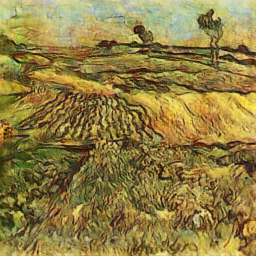

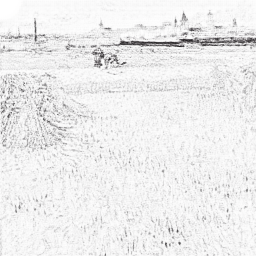

Time for epoch 76 is 236.60 sec
Epoch: [76/80]... Discriminators Loss: [0.287]... Generators Loss: [3.183]...
# ======================================================================================================================= #
Epoch [77/80], Step [50/344], Discriminators Loss [0.166], Generators Loss [3.527]
Epoch [77/80], Step [100/344], Discriminators Loss [0.134], Generators Loss [3.292]
Epoch [77/80], Step [150/344], Discriminators Loss [0.074], Generators Loss [2.948]
Epoch [77/80], Step [200/344], Discriminators Loss [0.369], Generators Loss [3.068]
Epoch [77/80], Step [250/344], Discriminators Loss [0.197], Generators Loss [3.675]
Epoch [77/80], Step [300/344], Discriminators Loss [0.393], Generators Loss [2.953]


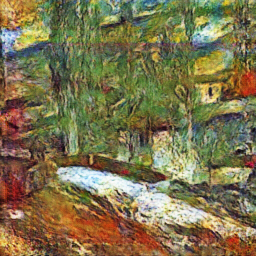

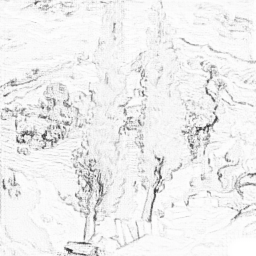

Time for epoch 77 is 236.77 sec
Epoch: [77/80]... Discriminators Loss: [0.254]... Generators Loss: [3.218]...
# ======================================================================================================================= #
Epoch [78/80], Step [50/344], Discriminators Loss [0.208], Generators Loss [3.140]
Epoch [78/80], Step [100/344], Discriminators Loss [0.079], Generators Loss [3.830]
Epoch [78/80], Step [150/344], Discriminators Loss [0.282], Generators Loss [4.345]
Epoch [78/80], Step [200/344], Discriminators Loss [0.254], Generators Loss [2.921]
Epoch [78/80], Step [250/344], Discriminators Loss [0.416], Generators Loss [3.564]
Epoch [78/80], Step [300/344], Discriminators Loss [0.074], Generators Loss [3.676]


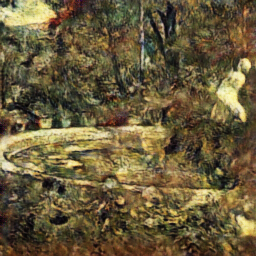

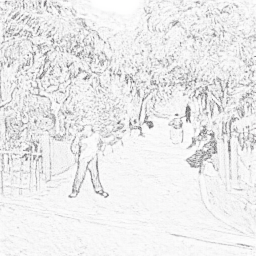

Time for epoch 78 is 236.61 sec
Epoch: [78/80]... Discriminators Loss: [0.229]... Generators Loss: [3.359]...
# ======================================================================================================================= #
Epoch [79/80], Step [50/344], Discriminators Loss [0.289], Generators Loss [3.082]
Epoch [79/80], Step [100/344], Discriminators Loss [0.340], Generators Loss [4.000]
Epoch [79/80], Step [150/344], Discriminators Loss [0.385], Generators Loss [3.116]
Epoch [79/80], Step [200/344], Discriminators Loss [0.363], Generators Loss [5.160]
Epoch [79/80], Step [250/344], Discriminators Loss [0.260], Generators Loss [3.368]
Epoch [79/80], Step [300/344], Discriminators Loss [0.532], Generators Loss [2.769]


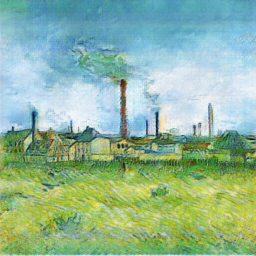

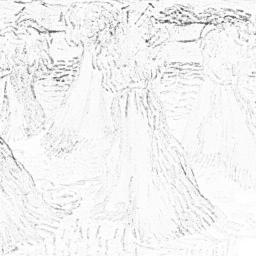

Time for epoch 79 is 236.84 sec
Epoch: [79/80]... Discriminators Loss: [0.306]... Generators Loss: [3.129]...
# ======================================================================================================================= #
Epoch [80/80], Step [50/344], Discriminators Loss [0.349], Generators Loss [4.262]
Epoch [80/80], Step [100/344], Discriminators Loss [0.282], Generators Loss [2.641]
Epoch [80/80], Step [150/344], Discriminators Loss [0.268], Generators Loss [2.606]
Epoch [80/80], Step [200/344], Discriminators Loss [0.374], Generators Loss [3.313]
Epoch [80/80], Step [250/344], Discriminators Loss [0.274], Generators Loss [2.897]
Epoch [80/80], Step [300/344], Discriminators Loss [0.101], Generators Loss [2.824]


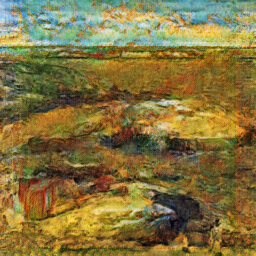

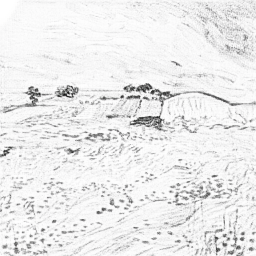

Time for epoch 80 is 236.73 sec
Epoch: [80/80]... Discriminators Loss: [0.302]... Generators Loss: [3.063]...
Epoch: [80/80]... Saving models...
# ======================================================================================================================= #


In [ ]:
# IMPORTANT >>>>>> Set last_epoch of the LAST CHECKPOINT
train(generatorS2P, generatorP2S, discriminatorS, discriminatorP, painting_loader, sketch_loader, last_epoch=60)

#### Epochs: 80 -> 100

In [ ]:
# Reload the models from last checkpoint

CHECKPOINTS_FOLDER = PATH+'/CycleGAN_Checkpoints'

epoch = 80
generatorS2P.load_state_dict(torch.load(CHECKPOINTS_FOLDER+'/generatorS2P_{}.ckpt'.format(epoch), map_location=torch.device(device)))
generatorP2S.load_state_dict(torch.load(CHECKPOINTS_FOLDER+'/generatorP2S_{}.ckpt'.format(epoch), map_location=torch.device(device)))
discriminatorS.load_state_dict(torch.load(CHECKPOINTS_FOLDER+'/discriminatorS_{}.ckpt'.format(epoch), map_location=torch.device(device)))
discriminatorP.load_state_dict(torch.load(CHECKPOINTS_FOLDER+'/discriminatorP_{}.ckpt'.format(epoch), map_location=torch.device(device)))


# Optimizers and criterions

learnig_rate = 2e-4

generator_optimizer = torch.optim.Adam(itertools.chain(generatorS2P.parameters(), generatorP2S.parameters()), lr=learnig_rate, betas=(0.5, 0.999))
discriminator_optimizer = torch.optim.Adam(itertools.chain(discriminatorS.parameters(), discriminatorP.parameters()), lr=learnig_rate, betas=(0.5, 0.999))

criterion_L1 = nn.L1Loss().to(device)
criterion_MSE = nn.MSELoss().to(device)

Epoch [81/100], Step [50/344], Discriminators Loss [0.123], Generators Loss [4.187]
Epoch [81/100], Step [100/344], Discriminators Loss [0.164], Generators Loss [4.104]
Epoch [81/100], Step [150/344], Discriminators Loss [0.324], Generators Loss [2.843]
Epoch [81/100], Step [200/344], Discriminators Loss [0.248], Generators Loss [2.846]
Epoch [81/100], Step [250/344], Discriminators Loss [0.410], Generators Loss [2.898]
Epoch [81/100], Step [300/344], Discriminators Loss [0.099], Generators Loss [3.562]


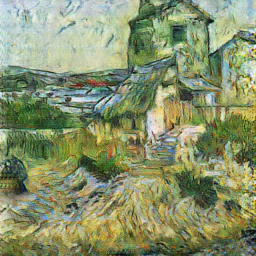

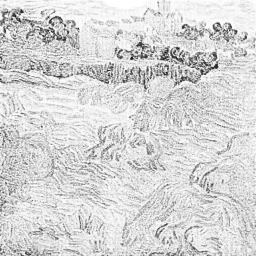

Time for epoch 81 is 537.88 sec
Epoch: [81/100]... Discriminators Loss: [0.238]... Generators Loss: [3.327]...
# ======================================================================================================================= #
Epoch [82/100], Step [50/344], Discriminators Loss [0.142], Generators Loss [3.152]
Epoch [82/100], Step [100/344], Discriminators Loss [0.297], Generators Loss [2.683]
Epoch [82/100], Step [150/344], Discriminators Loss [0.135], Generators Loss [2.990]
Epoch [82/100], Step [200/344], Discriminators Loss [0.383], Generators Loss [3.104]
Epoch [82/100], Step [250/344], Discriminators Loss [0.213], Generators Loss [2.480]
Epoch [82/100], Step [300/344], Discriminators Loss [0.369], Generators Loss [3.937]


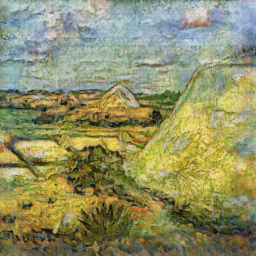

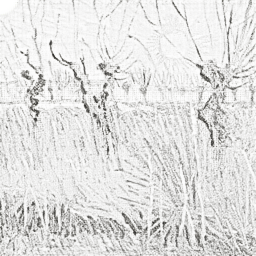

Time for epoch 82 is 540.52 sec
Epoch: [82/100]... Discriminators Loss: [0.265]... Generators Loss: [3.157]...
# ======================================================================================================================= #
Epoch [83/100], Step [50/344], Discriminators Loss [0.367], Generators Loss [3.171]
Epoch [83/100], Step [100/344], Discriminators Loss [0.324], Generators Loss [2.931]
Epoch [83/100], Step [150/344], Discriminators Loss [0.155], Generators Loss [3.425]
Epoch [83/100], Step [200/344], Discriminators Loss [0.107], Generators Loss [3.684]
Epoch [83/100], Step [250/344], Discriminators Loss [0.317], Generators Loss [3.841]
Epoch [83/100], Step [300/344], Discriminators Loss [0.124], Generators Loss [3.668]


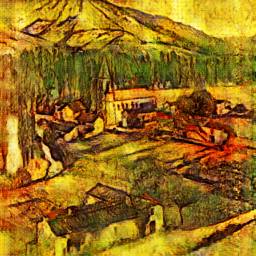

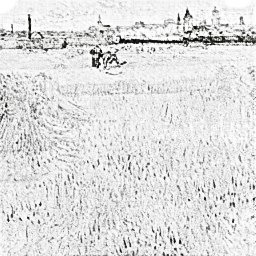

Time for epoch 83 is 541.47 sec
Epoch: [83/100]... Discriminators Loss: [0.213]... Generators Loss: [3.393]...
# ======================================================================================================================= #
Epoch [84/100], Step [50/344], Discriminators Loss [0.327], Generators Loss [4.275]
Epoch [84/100], Step [100/344], Discriminators Loss [0.172], Generators Loss [3.184]
Epoch [84/100], Step [150/344], Discriminators Loss [0.223], Generators Loss [2.690]
Epoch [84/100], Step [200/344], Discriminators Loss [0.426], Generators Loss [3.209]
Epoch [84/100], Step [250/344], Discriminators Loss [0.105], Generators Loss [2.503]
Epoch [84/100], Step [300/344], Discriminators Loss [0.176], Generators Loss [2.649]


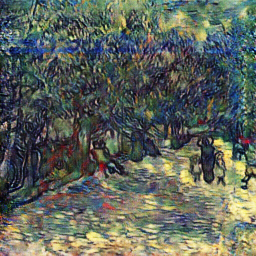

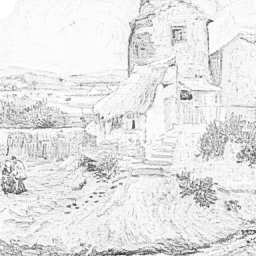

Time for epoch 84 is 544.20 sec
Epoch: [84/100]... Discriminators Loss: [0.223]... Generators Loss: [3.277]...
# ======================================================================================================================= #
Epoch [85/100], Step [50/344], Discriminators Loss [0.207], Generators Loss [3.236]
Epoch [85/100], Step [100/344], Discriminators Loss [0.087], Generators Loss [3.309]
Epoch [85/100], Step [150/344], Discriminators Loss [0.309], Generators Loss [2.681]
Epoch [85/100], Step [200/344], Discriminators Loss [0.258], Generators Loss [3.246]
Epoch [85/100], Step [250/344], Discriminators Loss [0.573], Generators Loss [2.386]
Epoch [85/100], Step [300/344], Discriminators Loss [0.185], Generators Loss [2.563]


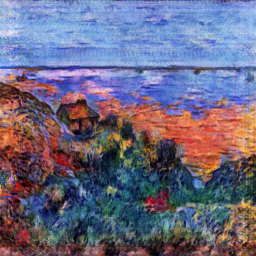

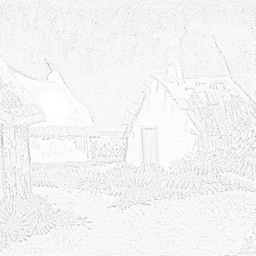

Time for epoch 85 is 539.55 sec
Epoch: [85/100]... Discriminators Loss: [0.229]... Generators Loss: [3.252]...
Epoch: [85/100]... Saving models...
# ======================================================================================================================= #
Epoch [86/100], Step [50/344], Discriminators Loss [0.340], Generators Loss [2.710]
Epoch [86/100], Step [100/344], Discriminators Loss [0.211], Generators Loss [2.545]
Epoch [86/100], Step [150/344], Discriminators Loss [0.125], Generators Loss [3.496]
Epoch [86/100], Step [200/344], Discriminators Loss [0.096], Generators Loss [3.373]
Epoch [86/100], Step [250/344], Discriminators Loss [0.211], Generators Loss [3.363]
Epoch [86/100], Step [300/344], Discriminators Loss [0.123], Generators Loss [3.447]


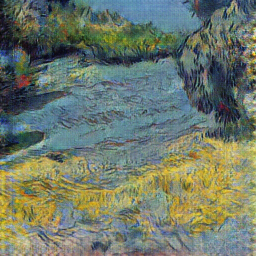

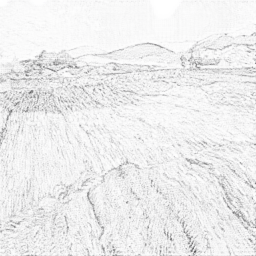

Time for epoch 86 is 539.33 sec
Epoch: [86/100]... Discriminators Loss: [0.237]... Generators Loss: [3.204]...
# ======================================================================================================================= #
Epoch [87/100], Step [50/344], Discriminators Loss [0.196], Generators Loss [4.414]
Epoch [87/100], Step [100/344], Discriminators Loss [0.193], Generators Loss [4.200]
Epoch [87/100], Step [150/344], Discriminators Loss [0.386], Generators Loss [4.175]
Epoch [87/100], Step [200/344], Discriminators Loss [0.381], Generators Loss [2.313]
Epoch [87/100], Step [250/344], Discriminators Loss [0.194], Generators Loss [3.348]
Epoch [87/100], Step [300/344], Discriminators Loss [0.158], Generators Loss [2.486]


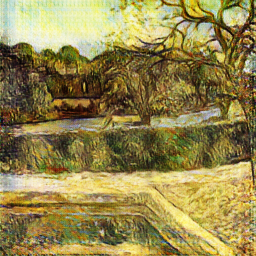

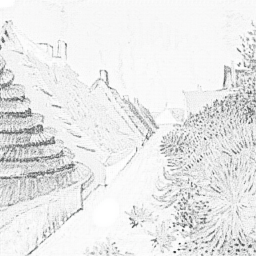

Time for epoch 87 is 539.24 sec
Epoch: [87/100]... Discriminators Loss: [0.233]... Generators Loss: [3.296]...
# ======================================================================================================================= #
Epoch [88/100], Step [50/344], Discriminators Loss [0.151], Generators Loss [3.893]
Epoch [88/100], Step [100/344], Discriminators Loss [0.103], Generators Loss [4.187]
Epoch [88/100], Step [150/344], Discriminators Loss [0.306], Generators Loss [3.855]
Epoch [88/100], Step [200/344], Discriminators Loss [0.194], Generators Loss [3.008]
Epoch [88/100], Step [250/344], Discriminators Loss [0.148], Generators Loss [3.391]
Epoch [88/100], Step [300/344], Discriminators Loss [0.204], Generators Loss [2.639]


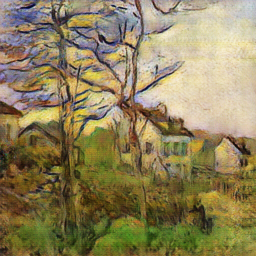

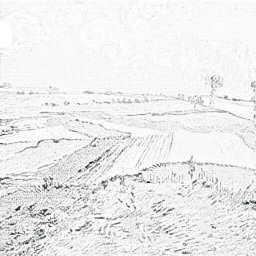

Time for epoch 88 is 539.85 sec
Epoch: [88/100]... Discriminators Loss: [0.262]... Generators Loss: [3.174]...
# ======================================================================================================================= #
Epoch [89/100], Step [50/344], Discriminators Loss [0.244], Generators Loss [2.517]
Epoch [89/100], Step [100/344], Discriminators Loss [0.113], Generators Loss [3.211]
Epoch [89/100], Step [150/344], Discriminators Loss [0.388], Generators Loss [3.330]
Epoch [89/100], Step [200/344], Discriminators Loss [0.225], Generators Loss [3.705]
Epoch [89/100], Step [250/344], Discriminators Loss [0.176], Generators Loss [4.022]
Epoch [89/100], Step [300/344], Discriminators Loss [0.397], Generators Loss [3.755]


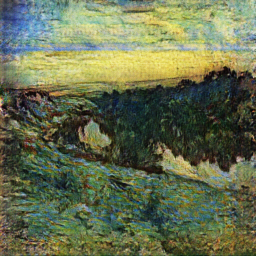

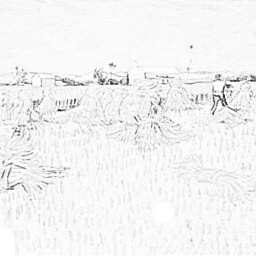

Time for epoch 89 is 538.77 sec
Epoch: [89/100]... Discriminators Loss: [0.234]... Generators Loss: [3.282]...
# ======================================================================================================================= #
Epoch [90/100], Step [50/344], Discriminators Loss [0.265], Generators Loss [2.867]
Epoch [90/100], Step [100/344], Discriminators Loss [0.071], Generators Loss [3.225]
Epoch [90/100], Step [150/344], Discriminators Loss [0.323], Generators Loss [2.970]
Epoch [90/100], Step [200/344], Discriminators Loss [0.205], Generators Loss [3.109]
Epoch [90/100], Step [250/344], Discriminators Loss [0.224], Generators Loss [3.741]
Epoch [90/100], Step [300/344], Discriminators Loss [0.388], Generators Loss [4.751]


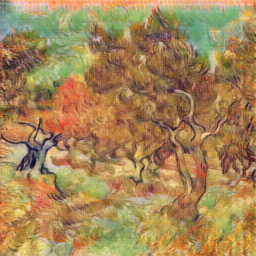

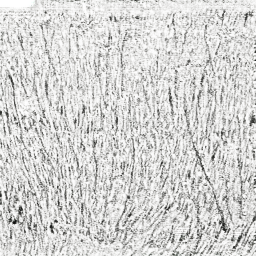

Time for epoch 90 is 538.95 sec
Epoch: [90/100]... Discriminators Loss: [0.215]... Generators Loss: [3.354]...
Epoch: [90/100]... Saving models...
# ======================================================================================================================= #
Epoch [91/100], Step [50/344], Discriminators Loss [0.271], Generators Loss [2.772]
Epoch [91/100], Step [100/344], Discriminators Loss [0.163], Generators Loss [3.203]
Epoch [91/100], Step [150/344], Discriminators Loss [0.157], Generators Loss [3.044]
Epoch [91/100], Step [200/344], Discriminators Loss [0.194], Generators Loss [3.857]
Epoch [91/100], Step [250/344], Discriminators Loss [0.133], Generators Loss [3.812]
Epoch [91/100], Step [300/344], Discriminators Loss [0.219], Generators Loss [2.696]


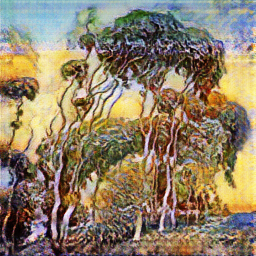

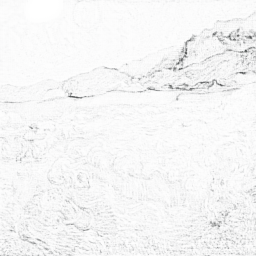

Time for epoch 91 is 538.36 sec
Epoch: [91/100]... Discriminators Loss: [0.212]... Generators Loss: [3.370]...
# ======================================================================================================================= #
Epoch [92/100], Step [50/344], Discriminators Loss [0.186], Generators Loss [2.791]
Epoch [92/100], Step [100/344], Discriminators Loss [0.089], Generators Loss [3.633]
Epoch [92/100], Step [150/344], Discriminators Loss [0.248], Generators Loss [3.452]
Epoch [92/100], Step [200/344], Discriminators Loss [0.213], Generators Loss [3.251]
Epoch [92/100], Step [250/344], Discriminators Loss [0.352], Generators Loss [3.000]
Epoch [92/100], Step [300/344], Discriminators Loss [0.238], Generators Loss [3.539]


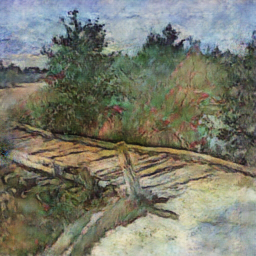

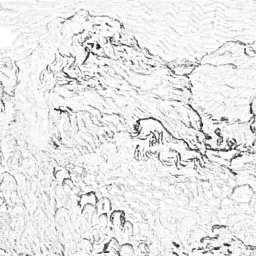

Time for epoch 92 is 537.82 sec
Epoch: [92/100]... Discriminators Loss: [0.239]... Generators Loss: [3.258]...
# ======================================================================================================================= #
Epoch [93/100], Step [50/344], Discriminators Loss [0.264], Generators Loss [2.883]
Epoch [93/100], Step [100/344], Discriminators Loss [0.369], Generators Loss [3.883]
Epoch [93/100], Step [150/344], Discriminators Loss [0.269], Generators Loss [3.897]
Epoch [93/100], Step [200/344], Discriminators Loss [0.221], Generators Loss [3.954]
Epoch [93/100], Step [250/344], Discriminators Loss [0.214], Generators Loss [4.327]
Epoch [93/100], Step [300/344], Discriminators Loss [0.161], Generators Loss [3.849]


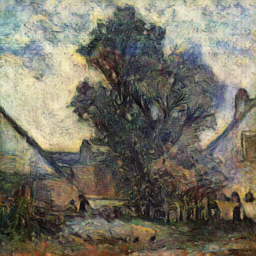

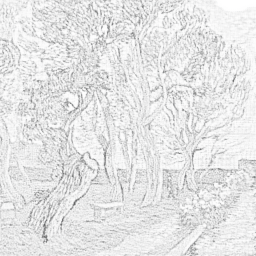

Time for epoch 93 is 537.87 sec
Epoch: [93/100]... Discriminators Loss: [0.192]... Generators Loss: [3.407]...
# ======================================================================================================================= #
Epoch [94/100], Step [50/344], Discriminators Loss [0.118], Generators Loss [3.251]
Epoch [94/100], Step [100/344], Discriminators Loss [0.304], Generators Loss [3.847]
Epoch [94/100], Step [150/344], Discriminators Loss [0.199], Generators Loss [3.122]
Epoch [94/100], Step [200/344], Discriminators Loss [0.251], Generators Loss [3.073]
Epoch [94/100], Step [250/344], Discriminators Loss [0.092], Generators Loss [3.128]
Epoch [94/100], Step [300/344], Discriminators Loss [0.224], Generators Loss [2.927]


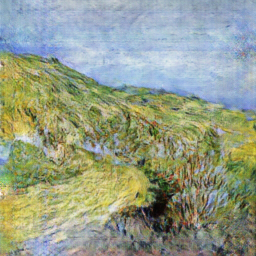

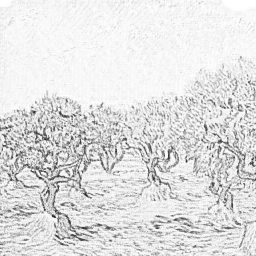

Time for epoch 94 is 538.45 sec
Epoch: [94/100]... Discriminators Loss: [0.225]... Generators Loss: [3.217]...
# ======================================================================================================================= #
Epoch [95/100], Step [50/344], Discriminators Loss [0.304], Generators Loss [2.949]
Epoch [95/100], Step [100/344], Discriminators Loss [0.274], Generators Loss [2.966]
Epoch [95/100], Step [150/344], Discriminators Loss [0.309], Generators Loss [2.551]
Epoch [95/100], Step [200/344], Discriminators Loss [0.326], Generators Loss [2.578]
Epoch [95/100], Step [250/344], Discriminators Loss [0.153], Generators Loss [2.775]
Epoch [95/100], Step [300/344], Discriminators Loss [0.182], Generators Loss [2.951]


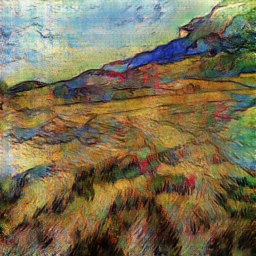

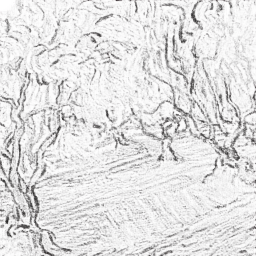

Time for epoch 95 is 538.54 sec
Epoch: [95/100]... Discriminators Loss: [0.288]... Generators Loss: [3.068]...
Epoch: [95/100]... Saving models...
# ======================================================================================================================= #
Epoch [96/100], Step [50/344], Discriminators Loss [0.116], Generators Loss [3.246]
Epoch [96/100], Step [100/344], Discriminators Loss [0.127], Generators Loss [3.765]
Epoch [96/100], Step [150/344], Discriminators Loss [0.041], Generators Loss [3.288]
Epoch [96/100], Step [200/344], Discriminators Loss [0.097], Generators Loss [3.706]
Epoch [96/100], Step [250/344], Discriminators Loss [0.214], Generators Loss [3.773]
Epoch [96/100], Step [300/344], Discriminators Loss [0.106], Generators Loss [2.722]


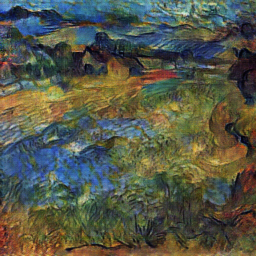

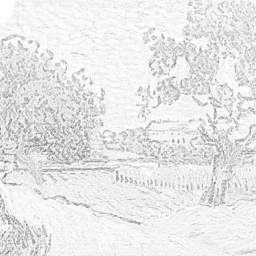

Time for epoch 96 is 539.35 sec
Epoch: [96/100]... Discriminators Loss: [0.220]... Generators Loss: [3.213]...
# ======================================================================================================================= #
Epoch [97/100], Step [50/344], Discriminators Loss [0.130], Generators Loss [2.934]
Epoch [97/100], Step [100/344], Discriminators Loss [0.322], Generators Loss [2.868]
Epoch [97/100], Step [150/344], Discriminators Loss [0.253], Generators Loss [3.439]
Epoch [97/100], Step [200/344], Discriminators Loss [0.272], Generators Loss [2.962]
Epoch [97/100], Step [250/344], Discriminators Loss [0.348], Generators Loss [2.559]
Epoch [97/100], Step [300/344], Discriminators Loss [0.483], Generators Loss [2.666]


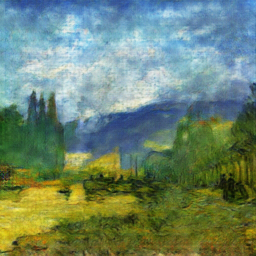

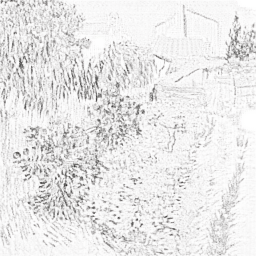

Time for epoch 97 is 544.33 sec
Epoch: [97/100]... Discriminators Loss: [0.295]... Generators Loss: [3.134]...
# ======================================================================================================================= #
Epoch [98/100], Step [50/344], Discriminators Loss [0.358], Generators Loss [2.664]
Epoch [98/100], Step [100/344], Discriminators Loss [0.165], Generators Loss [3.149]
Epoch [98/100], Step [150/344], Discriminators Loss [0.110], Generators Loss [2.776]
Epoch [98/100], Step [200/344], Discriminators Loss [0.600], Generators Loss [3.104]
Epoch [98/100], Step [250/344], Discriminators Loss [0.267], Generators Loss [3.263]
Epoch [98/100], Step [300/344], Discriminators Loss [0.416], Generators Loss [2.716]


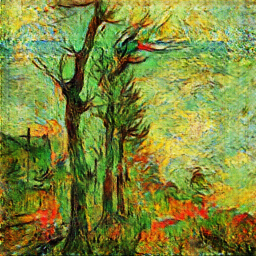

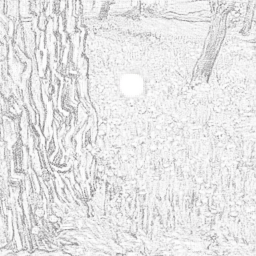

Time for epoch 98 is 541.36 sec
Epoch: [98/100]... Discriminators Loss: [0.230]... Generators Loss: [3.253]...
# ======================================================================================================================= #
Epoch [99/100], Step [50/344], Discriminators Loss [0.188], Generators Loss [4.120]
Epoch [99/100], Step [100/344], Discriminators Loss [0.221], Generators Loss [4.452]
Epoch [99/100], Step [150/344], Discriminators Loss [0.176], Generators Loss [2.959]
Epoch [99/100], Step [200/344], Discriminators Loss [0.185], Generators Loss [3.937]
Epoch [99/100], Step [250/344], Discriminators Loss [0.101], Generators Loss [4.018]
Epoch [99/100], Step [300/344], Discriminators Loss [0.178], Generators Loss [2.590]


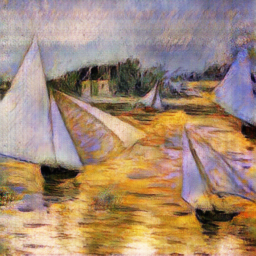

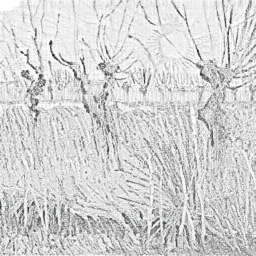

Time for epoch 99 is 542.65 sec
Epoch: [99/100]... Discriminators Loss: [0.193]... Generators Loss: [3.481]...
# ======================================================================================================================= #
Epoch [100/100], Step [50/344], Discriminators Loss [0.175], Generators Loss [3.422]
Epoch [100/100], Step [100/344], Discriminators Loss [0.137], Generators Loss [3.436]
Epoch [100/100], Step [150/344], Discriminators Loss [0.136], Generators Loss [3.280]
Epoch [100/100], Step [200/344], Discriminators Loss [0.106], Generators Loss [2.843]
Epoch [100/100], Step [250/344], Discriminators Loss [0.379], Generators Loss [3.289]
Epoch [100/100], Step [300/344], Discriminators Loss [0.172], Generators Loss [3.861]


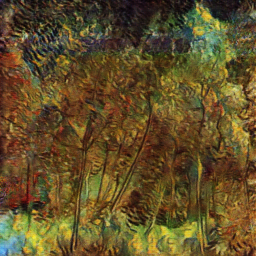

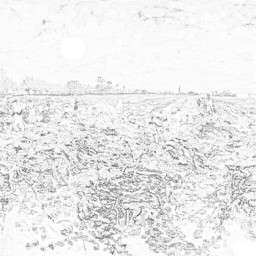

Time for epoch 100 is 540.92 sec
Epoch: [100/100]... Discriminators Loss: [0.203]... Generators Loss: [3.349]...
Epoch: [100/100]... Saving models...
# ======================================================================================================================= #


In [ ]:
# IMPORTANT >>>>>> Set last_epoch of the LAST CHECKPOINT
train(generatorS2P, generatorP2S, discriminatorS, discriminatorP, painting_loader, sketch_loader, last_epoch=80)

#### Epochs: 100 -> 120

In [ ]:
# Reload the models from last checkpoint

CHECKPOINTS_FOLDER = PATH+'/CycleGAN_Checkpoints'

epoch = 100
generatorS2P.load_state_dict(torch.load(CHECKPOINTS_FOLDER+'/generatorS2P_{}.ckpt'.format(epoch), map_location=torch.device(device)))
generatorP2S.load_state_dict(torch.load(CHECKPOINTS_FOLDER+'/generatorP2S_{}.ckpt'.format(epoch), map_location=torch.device(device)))
discriminatorS.load_state_dict(torch.load(CHECKPOINTS_FOLDER+'/discriminatorS_{}.ckpt'.format(epoch), map_location=torch.device(device)))
discriminatorP.load_state_dict(torch.load(CHECKPOINTS_FOLDER+'/discriminatorP_{}.ckpt'.format(epoch), map_location=torch.device(device)))


# Optimizers and criterions

learnig_rate = 2e-5

generator_optimizer = torch.optim.Adam(itertools.chain(generatorS2P.parameters(), generatorP2S.parameters()), lr=learnig_rate, betas=(0.5, 0.999))
discriminator_optimizer = torch.optim.Adam(itertools.chain(discriminatorS.parameters(), discriminatorP.parameters()), lr=learnig_rate, betas=(0.5, 0.999))

criterion_L1 = nn.L1Loss().to(device)
criterion_MSE = nn.MSELoss().to(device)

Epoch [101/120], Step [50/344], Discriminators Loss [0.242], Generators Loss [2.735]
Epoch [101/120], Step [100/344], Discriminators Loss [0.249], Generators Loss [2.235]
Epoch [101/120], Step [150/344], Discriminators Loss [0.311], Generators Loss [2.486]
Epoch [101/120], Step [200/344], Discriminators Loss [0.151], Generators Loss [2.698]
Epoch [101/120], Step [250/344], Discriminators Loss [0.191], Generators Loss [2.772]
Epoch [101/120], Step [300/344], Discriminators Loss [0.144], Generators Loss [2.738]


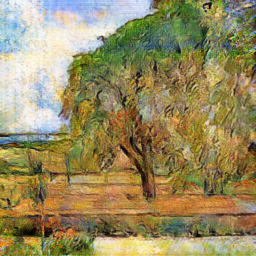

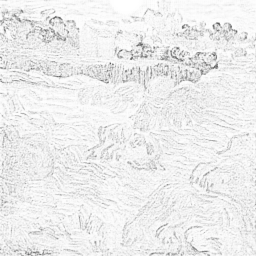

Time for epoch 101 is 241.41 sec
Epoch: [101/120]... Discriminators Loss: [0.223]... Generators Loss: [2.922]...
Epoch: [101/120]... Saving models...
# ======================================================================================================================= #
Epoch [102/120], Step [50/344], Discriminators Loss [0.209], Generators Loss [2.486]
Epoch [102/120], Step [100/344], Discriminators Loss [0.231], Generators Loss [2.499]
Epoch [102/120], Step [150/344], Discriminators Loss [0.113], Generators Loss [2.430]
Epoch [102/120], Step [200/344], Discriminators Loss [0.235], Generators Loss [2.809]
Epoch [102/120], Step [250/344], Discriminators Loss [0.316], Generators Loss [3.434]
Epoch [102/120], Step [300/344], Discriminators Loss [0.257], Generators Loss [2.698]


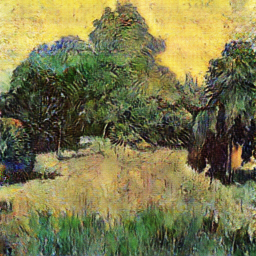

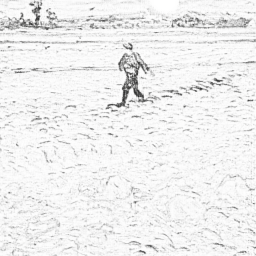

Time for epoch 102 is 243.44 sec
Epoch: [102/120]... Discriminators Loss: [0.228]... Generators Loss: [2.854]...
Epoch: [102/120]... Saving models...
# ======================================================================================================================= #
Epoch [103/120], Step [50/344], Discriminators Loss [0.261], Generators Loss [2.944]
Epoch [103/120], Step [100/344], Discriminators Loss [0.219], Generators Loss [3.348]
Epoch [103/120], Step [150/344], Discriminators Loss [0.251], Generators Loss [3.586]
Epoch [103/120], Step [200/344], Discriminators Loss [0.293], Generators Loss [2.691]
Epoch [103/120], Step [250/344], Discriminators Loss [0.181], Generators Loss [2.546]
Epoch [103/120], Step [300/344], Discriminators Loss [0.344], Generators Loss [3.635]


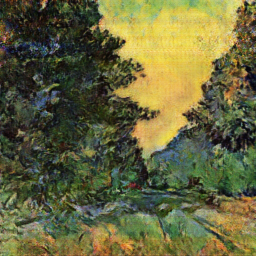

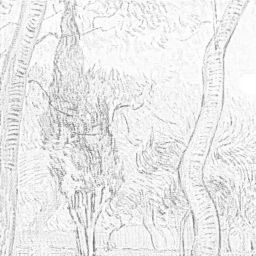

Time for epoch 103 is 243.29 sec
Epoch: [103/120]... Discriminators Loss: [0.228]... Generators Loss: [2.877]...
Epoch: [103/120]... Saving models...
# ======================================================================================================================= #
Epoch [104/120], Step [50/344], Discriminators Loss [0.225], Generators Loss [2.521]
Epoch [104/120], Step [100/344], Discriminators Loss [0.196], Generators Loss [2.633]
Epoch [104/120], Step [150/344], Discriminators Loss [0.188], Generators Loss [2.594]
Epoch [104/120], Step [200/344], Discriminators Loss [0.190], Generators Loss [3.357]
Epoch [104/120], Step [250/344], Discriminators Loss [0.207], Generators Loss [3.262]
Epoch [104/120], Step [300/344], Discriminators Loss [0.269], Generators Loss [2.700]


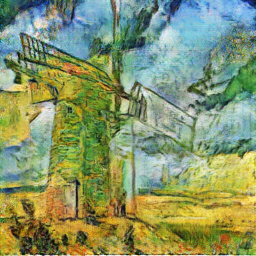

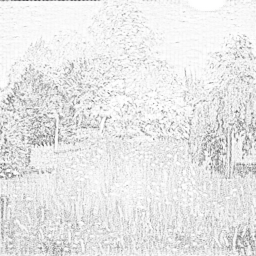

Time for epoch 104 is 243.58 sec
Epoch: [104/120]... Discriminators Loss: [0.237]... Generators Loss: [2.869]...
Epoch: [104/120]... Saving models...
# ======================================================================================================================= #
Epoch [105/120], Step [50/344], Discriminators Loss [0.209], Generators Loss [3.462]
Epoch [105/120], Step [100/344], Discriminators Loss [0.294], Generators Loss [3.927]
Epoch [105/120], Step [150/344], Discriminators Loss [0.237], Generators Loss [3.018]
Epoch [105/120], Step [200/344], Discriminators Loss [0.281], Generators Loss [2.715]
Epoch [105/120], Step [250/344], Discriminators Loss [0.234], Generators Loss [2.483]
Epoch [105/120], Step [300/344], Discriminators Loss [0.280], Generators Loss [3.100]


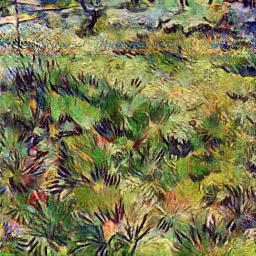

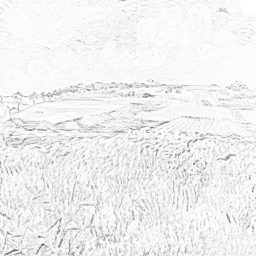

Time for epoch 105 is 243.34 sec
Epoch: [105/120]... Discriminators Loss: [0.235]... Generators Loss: [2.915]...
Epoch: [105/120]... Saving models...
# ======================================================================================================================= #
Epoch [106/120], Step [50/344], Discriminators Loss [0.180], Generators Loss [2.614]
Epoch [106/120], Step [100/344], Discriminators Loss [0.233], Generators Loss [2.985]
Epoch [106/120], Step [150/344], Discriminators Loss [0.348], Generators Loss [2.696]
Epoch [106/120], Step [200/344], Discriminators Loss [0.247], Generators Loss [3.645]
Epoch [106/120], Step [250/344], Discriminators Loss [0.176], Generators Loss [2.771]
Epoch [106/120], Step [300/344], Discriminators Loss [0.214], Generators Loss [3.143]


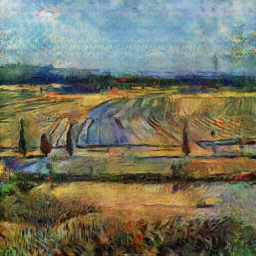

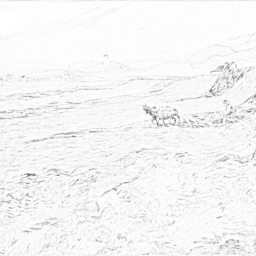

Time for epoch 106 is 242.95 sec
Epoch: [106/120]... Discriminators Loss: [0.249]... Generators Loss: [2.910]...
Epoch: [106/120]... Saving models...
# ======================================================================================================================= #
Epoch [107/120], Step [50/344], Discriminators Loss [0.223], Generators Loss [2.664]
Epoch [107/120], Step [100/344], Discriminators Loss [0.214], Generators Loss [3.475]
Epoch [107/120], Step [150/344], Discriminators Loss [0.300], Generators Loss [2.360]
Epoch [107/120], Step [200/344], Discriminators Loss [0.293], Generators Loss [3.320]
Epoch [107/120], Step [250/344], Discriminators Loss [0.109], Generators Loss [2.631]
Epoch [107/120], Step [300/344], Discriminators Loss [0.382], Generators Loss [2.719]


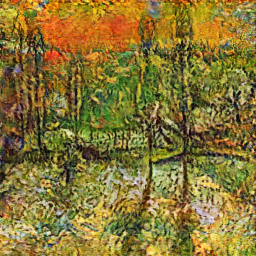

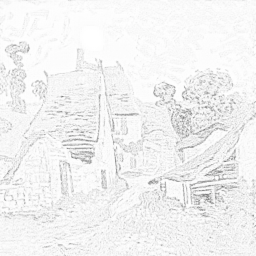

Time for epoch 107 is 243.15 sec
Epoch: [107/120]... Discriminators Loss: [0.242]... Generators Loss: [2.796]...
Epoch: [107/120]... Saving models...
# ======================================================================================================================= #
Epoch [108/120], Step [50/344], Discriminators Loss [0.303], Generators Loss [2.753]
Epoch [108/120], Step [100/344], Discriminators Loss [0.282], Generators Loss [2.467]
Epoch [108/120], Step [150/344], Discriminators Loss [0.222], Generators Loss [2.616]
Epoch [108/120], Step [200/344], Discriminators Loss [0.372], Generators Loss [3.165]
Epoch [108/120], Step [250/344], Discriminators Loss [0.089], Generators Loss [2.648]
Epoch [108/120], Step [300/344], Discriminators Loss [0.251], Generators Loss [3.077]


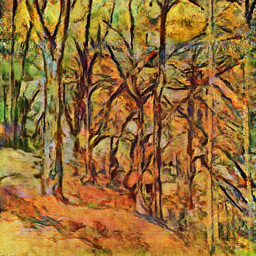

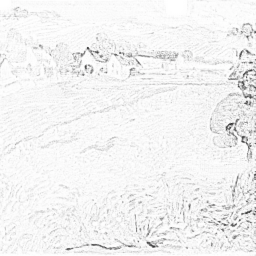

Time for epoch 108 is 242.93 sec
Epoch: [108/120]... Discriminators Loss: [0.247]... Generators Loss: [2.848]...
Epoch: [108/120]... Saving models...
# ======================================================================================================================= #
Epoch [109/120], Step [50/344], Discriminators Loss [0.354], Generators Loss [2.407]
Epoch [109/120], Step [100/344], Discriminators Loss [0.239], Generators Loss [2.920]
Epoch [109/120], Step [150/344], Discriminators Loss [0.311], Generators Loss [2.297]
Epoch [109/120], Step [200/344], Discriminators Loss [0.249], Generators Loss [2.370]
Epoch [109/120], Step [250/344], Discriminators Loss [0.192], Generators Loss [3.218]
Epoch [109/120], Step [300/344], Discriminators Loss [0.171], Generators Loss [2.938]


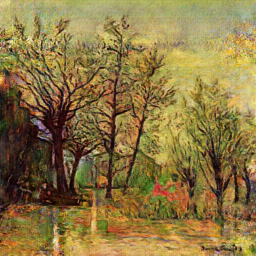

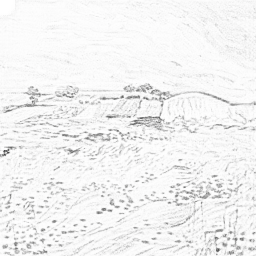

Time for epoch 109 is 243.12 sec
Epoch: [109/120]... Discriminators Loss: [0.240]... Generators Loss: [2.872]...
Epoch: [109/120]... Saving models...
# ======================================================================================================================= #
Epoch [110/120], Step [50/344], Discriminators Loss [0.298], Generators Loss [3.260]
Epoch [110/120], Step [100/344], Discriminators Loss [0.128], Generators Loss [3.076]
Epoch [110/120], Step [150/344], Discriminators Loss [0.236], Generators Loss [2.375]
Epoch [110/120], Step [200/344], Discriminators Loss [0.245], Generators Loss [2.555]
Epoch [110/120], Step [250/344], Discriminators Loss [0.231], Generators Loss [2.408]
Epoch [110/120], Step [300/344], Discriminators Loss [0.256], Generators Loss [2.747]


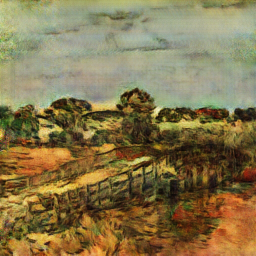

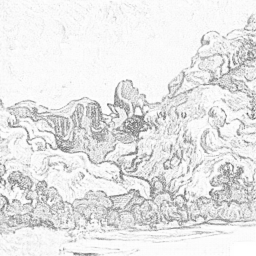

Time for epoch 110 is 243.54 sec
Epoch: [110/120]... Discriminators Loss: [0.245]... Generators Loss: [2.853]...
Epoch: [110/120]... Saving models...
# ======================================================================================================================= #
Epoch [111/120], Step [50/344], Discriminators Loss [0.278], Generators Loss [2.454]
Epoch [111/120], Step [100/344], Discriminators Loss [0.186], Generators Loss [2.864]
Epoch [111/120], Step [150/344], Discriminators Loss [0.249], Generators Loss [2.634]
Epoch [111/120], Step [200/344], Discriminators Loss [0.301], Generators Loss [2.960]
Epoch [111/120], Step [250/344], Discriminators Loss [0.213], Generators Loss [4.226]
Epoch [111/120], Step [300/344], Discriminators Loss [0.374], Generators Loss [2.873]


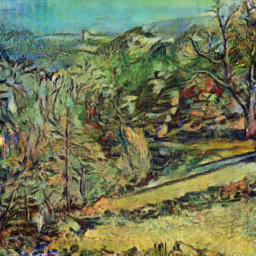

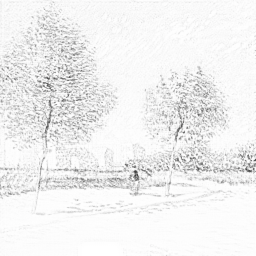

Time for epoch 111 is 243.16 sec
Epoch: [111/120]... Discriminators Loss: [0.246]... Generators Loss: [2.867]...
Epoch: [111/120]... Saving models...
# ======================================================================================================================= #
Epoch [112/120], Step [50/344], Discriminators Loss [0.231], Generators Loss [3.336]
Epoch [112/120], Step [100/344], Discriminators Loss [0.217], Generators Loss [3.006]
Epoch [112/120], Step [150/344], Discriminators Loss [0.229], Generators Loss [2.662]
Epoch [112/120], Step [200/344], Discriminators Loss [0.168], Generators Loss [2.448]
Epoch [112/120], Step [250/344], Discriminators Loss [0.246], Generators Loss [3.161]
Epoch [112/120], Step [300/344], Discriminators Loss [0.261], Generators Loss [2.672]


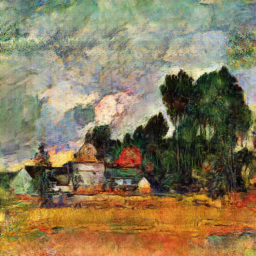

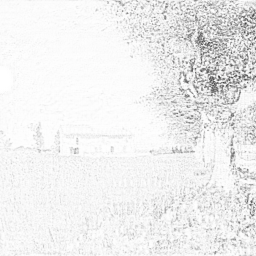

Time for epoch 112 is 243.40 sec
Epoch: [112/120]... Discriminators Loss: [0.245]... Generators Loss: [2.869]...
Epoch: [112/120]... Saving models...
# ======================================================================================================================= #
Epoch [113/120], Step [50/344], Discriminators Loss [0.254], Generators Loss [2.980]
Epoch [113/120], Step [100/344], Discriminators Loss [0.263], Generators Loss [2.720]
Epoch [113/120], Step [150/344], Discriminators Loss [0.191], Generators Loss [2.783]
Epoch [113/120], Step [200/344], Discriminators Loss [0.239], Generators Loss [2.546]
Epoch [113/120], Step [250/344], Discriminators Loss [0.244], Generators Loss [3.485]
Epoch [113/120], Step [300/344], Discriminators Loss [0.188], Generators Loss [2.585]


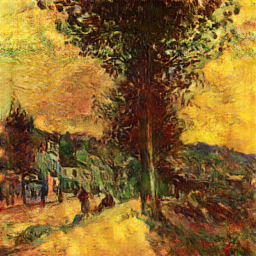

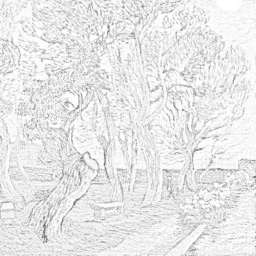

Time for epoch 113 is 243.32 sec
Epoch: [113/120]... Discriminators Loss: [0.247]... Generators Loss: [2.865]...
Epoch: [113/120]... Saving models...
# ======================================================================================================================= #
Epoch [114/120], Step [50/344], Discriminators Loss [0.207], Generators Loss [3.486]
Epoch [114/120], Step [100/344], Discriminators Loss [0.409], Generators Loss [2.466]
Epoch [114/120], Step [150/344], Discriminators Loss [0.173], Generators Loss [3.398]
Epoch [114/120], Step [200/344], Discriminators Loss [0.121], Generators Loss [3.418]
Epoch [114/120], Step [250/344], Discriminators Loss [0.192], Generators Loss [3.317]
Epoch [114/120], Step [300/344], Discriminators Loss [0.263], Generators Loss [2.493]


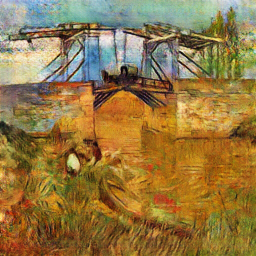

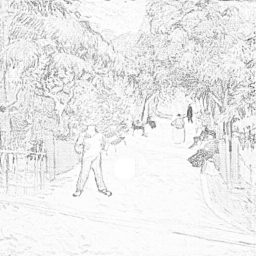

Time for epoch 114 is 243.03 sec
Epoch: [114/120]... Discriminators Loss: [0.259]... Generators Loss: [2.868]...
Epoch: [114/120]... Saving models...
# ======================================================================================================================= #
Epoch [115/120], Step [50/344], Discriminators Loss [0.204], Generators Loss [2.706]
Epoch [115/120], Step [100/344], Discriminators Loss [0.211], Generators Loss [3.263]
Epoch [115/120], Step [150/344], Discriminators Loss [0.263], Generators Loss [3.084]
Epoch [115/120], Step [200/344], Discriminators Loss [0.226], Generators Loss [2.644]
Epoch [115/120], Step [250/344], Discriminators Loss [0.284], Generators Loss [2.402]
Epoch [115/120], Step [300/344], Discriminators Loss [0.246], Generators Loss [2.530]


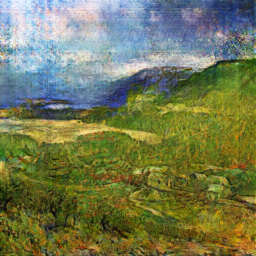

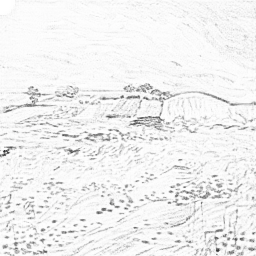

Time for epoch 115 is 243.47 sec
Epoch: [115/120]... Discriminators Loss: [0.252]... Generators Loss: [2.883]...
Epoch: [115/120]... Saving models...
# ======================================================================================================================= #
Epoch [116/120], Step [50/344], Discriminators Loss [0.222], Generators Loss [2.349]
Epoch [116/120], Step [100/344], Discriminators Loss [0.289], Generators Loss [2.817]
Epoch [116/120], Step [150/344], Discriminators Loss [0.169], Generators Loss [2.194]
Epoch [116/120], Step [200/344], Discriminators Loss [0.234], Generators Loss [3.395]
Epoch [116/120], Step [250/344], Discriminators Loss [0.193], Generators Loss [2.574]
Epoch [116/120], Step [300/344], Discriminators Loss [0.239], Generators Loss [3.206]


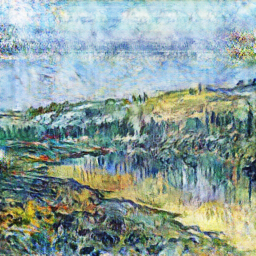

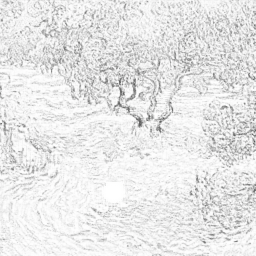

Time for epoch 116 is 243.33 sec
Epoch: [116/120]... Discriminators Loss: [0.256]... Generators Loss: [2.842]...
Epoch: [116/120]... Saving models...
# ======================================================================================================================= #
Epoch [117/120], Step [50/344], Discriminators Loss [0.298], Generators Loss [2.540]
Epoch [117/120], Step [100/344], Discriminators Loss [0.422], Generators Loss [2.904]
Epoch [117/120], Step [150/344], Discriminators Loss [0.218], Generators Loss [3.067]
Epoch [117/120], Step [200/344], Discriminators Loss [0.241], Generators Loss [2.824]
Epoch [117/120], Step [250/344], Discriminators Loss [0.245], Generators Loss [3.033]
Epoch [117/120], Step [300/344], Discriminators Loss [0.248], Generators Loss [4.045]


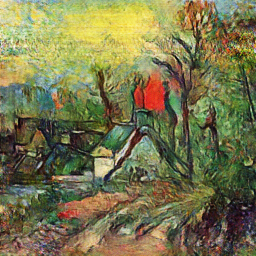

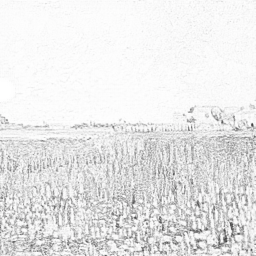

Time for epoch 117 is 243.58 sec
Epoch: [117/120]... Discriminators Loss: [0.256]... Generators Loss: [2.856]...
Epoch: [117/120]... Saving models...
# ======================================================================================================================= #
Epoch [118/120], Step [50/344], Discriminators Loss [0.202], Generators Loss [2.376]
Epoch [118/120], Step [100/344], Discriminators Loss [0.177], Generators Loss [2.468]
Epoch [118/120], Step [150/344], Discriminators Loss [0.149], Generators Loss [2.070]
Epoch [118/120], Step [200/344], Discriminators Loss [0.154], Generators Loss [3.412]
Epoch [118/120], Step [250/344], Discriminators Loss [0.283], Generators Loss [3.157]
Epoch [118/120], Step [300/344], Discriminators Loss [0.354], Generators Loss [2.753]


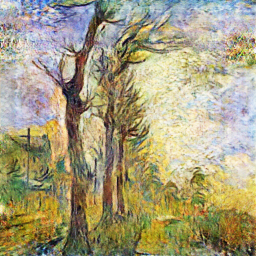

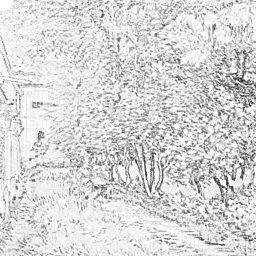

Time for epoch 118 is 243.33 sec
Epoch: [118/120]... Discriminators Loss: [0.257]... Generators Loss: [2.861]...
Epoch: [118/120]... Saving models...
# ======================================================================================================================= #
Epoch [119/120], Step [50/344], Discriminators Loss [0.209], Generators Loss [2.132]
Epoch [119/120], Step [100/344], Discriminators Loss [0.253], Generators Loss [3.205]
Epoch [119/120], Step [150/344], Discriminators Loss [0.208], Generators Loss [2.697]
Epoch [119/120], Step [200/344], Discriminators Loss [0.134], Generators Loss [2.670]
Epoch [119/120], Step [250/344], Discriminators Loss [0.302], Generators Loss [3.290]
Epoch [119/120], Step [300/344], Discriminators Loss [0.277], Generators Loss [2.163]


In [ ]:
# IMPORTANT >>>>>> Set last_epoch of the LAST CHECKPOINT
train(generatorS2P, generatorP2S, discriminatorS, discriminatorP, painting_loader, sketch_loader, last_epoch=100)